# Prices and Embodied Carbon change. This will be final. I will not change anymore.

# Imports

In [28]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, TensorDataset
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
import csv
import os
# PyTorch
import torch
import torch.nn as nn

# Data Handling
import pandas as pd
import numpy as np

# Scikit-Learn
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler

# CatBoost
import catboost

# Pymoo (Multi-Objective Optimization)
from pymoo.indicators.hv import HV
from pymoo.util.nds.non_dominated_sorting import NonDominatedSorting
from pymoo.algorithms.moo.nsga2 import NSGA2
from pymoo.core.problem import Problem
from pymoo.optimize import minimize
from pymoo.visualization.scatter import Scatter

import matplotlib.pyplot as plt
import seaborn as sns


# Load data

In [29]:
# Load dataset
data_filepath = r"Wiley.csv"

wiley_data = pd.read_csv(data_filepath)
# remove
df = wiley_data.drop(['Index','Unnamed: 16'], axis=1)

  # Update with your actual CSV file path

# Separate input features (X) and output feature (Y)
X = df.drop(columns=['fc (MPa)']).values  # All features except target
Y = df[['fc (MPa)']].values  # Target variable

# Split data
Make sure that data is split between train and test so that MinMaxScaler will not have problems.

In [30]:
# The min and max must be checked to ensure that scaling is performed properly.
# The min and max of each feature in the test must be within the range of min and max of the 
# corresponding feature in the train.
# Otherwise, the scaling of the test will generate greater than 1 or less than 0 values.
# Thus, we will find the min and max and make sure they follow the above conditions.

# Define function to check min-max conditions for both X and Y
def min_max_check(train, test):
    min_train, max_train = train.min(axis=0), train.max(axis=0)
    min_test, max_test = test.min(axis=0), test.max(axis=0)
    
    return np.all(min_train <= min_test) and np.all(max_train >= max_test)

# Try splitting up to 10 times
for attempt in range(10):
    X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.2, random_state=42 + attempt)

    if min_max_check(X_train, X_test) and min_max_check(Y_train, Y_test):
        print(f"Valid split found on attempt {attempt + 1}")
        break
else:
    print("Failed to find a valid split after 10 attempts.")

# Report min and max values
train_min_max_X = pd.DataFrame({'Min': X_train.min(axis=0), 'Max': X_train.max(axis=0)})
test_min_max_X = pd.DataFrame({'Min': X_test.min(axis=0), 'Max': X_test.max(axis=0)})

train_min_max_Y = pd.DataFrame({'Min': Y_train.min(axis=0), 'Max': Y_train.max(axis=0)})
test_min_max_Y = pd.DataFrame({'Min': Y_test.min(axis=0), 'Max': Y_test.max(axis=0)})

print("\nTrain set min-max (X):\n", train_min_max_X)
print("\nTest set min-max (X):\n", test_min_max_X)

print("\nTrain set min-max (Y):\n", train_min_max_Y)
print("\nTest set min-max (Y):\n", test_min_max_Y)


Valid split found on attempt 3

Train set min-max (X):
       Min     Max
0   270.0  1251.2
1     0.0   433.7
2     0.0   375.0
3     0.0   356.0
4     0.0   397.0
5     0.0   772.2
6     0.0    38.0
7     0.0   234.0
8     0.0  1502.8
9     0.0  1195.0
10   90.0   234.0
11    1.1    57.0
12   20.0   200.0
13   50.0   100.0
14    1.0   365.0

Test set min-max (X):
        Min     Max
0   401.00  1251.2
1     0.00   433.7
2     0.00   360.0
3     0.00   270.0
4     0.00   397.0
5     0.00   772.2
6     0.00    34.5
7     0.00   234.0
8     0.00  1502.8
9     0.00  1138.0
10  126.00   234.0
11    3.85    57.0
12   20.00    90.0
13   60.00   100.0
14    1.00   365.0

Train set min-max (Y):
     Min    Max
0  32.5  220.5

Test set min-max (Y):
     Min    Max
0  39.1  206.6


# Normalizing data

In [31]:
# Initialize scalers
scaler_X = MinMaxScaler()
scaler_Y = MinMaxScaler()

# Fit on training data only and transform both sets
X_train_normalized = scaler_X.fit_transform(X_train)
X_test_normalized = scaler_X.transform(X_test)  # Use transform, not fit_transform

Y_train_normalized = scaler_Y.fit_transform(Y_train)
Y_test_normalized = scaler_Y.transform(Y_test)  # Use transform, not fit_transform

# Convert data to PyTorch tensors
X_train_tensor = torch.tensor(X_train_normalized, dtype=torch.float32)
Y_train_tensor = torch.tensor(Y_train_normalized, dtype=torch.float32)
X_test_tensor = torch.tensor(X_test_normalized, dtype=torch.float32)
Y_test_tensor = torch.tensor(Y_test_normalized, dtype=torch.float32)

# Create DataLoaders for training and testing
# batch_size = 64 original
batch_size = 32
train_loader = DataLoader(TensorDataset(X_train_tensor, Y_train_tensor), batch_size=batch_size, shuffle=True)
test_loader = DataLoader(TensorDataset(X_test_tensor, Y_test_tensor), batch_size=batch_size, shuffle=False)


# Conditional Variational Autoencoder definition

In [32]:
# Define CVAE model
class CVAE(nn.Module):
    def __init__(self, input_dim, cond_dim, latent_dim=2):
        super(CVAE, self).__init__()

        # Encoder: Learns (z | X, Y)
        self.encoder = nn.Sequential(
            nn.Linear(input_dim + cond_dim, 256),
            nn.ReLU(),
            nn.Linear(256,128),
            nn.ReLU()
        )
        self.mu = nn.Linear(128, latent_dim)
        self.logvar = nn.Linear(128, latent_dim)

        # Decoder: Learns (X' | z, Y)
        self.decoder = nn.Sequential(
            nn.Linear(latent_dim + cond_dim, 128),
            nn.ReLU(),
            nn.Linear(128, 256),
            nn.ReLU(),
            nn.Linear(256, input_dim),
            nn.Sigmoid()  # Output in [0,1] range
        )

    def encode(self, x, y):
        inputs = torch.cat((x, y), dim=1)  # Concatenate input features with condition
        h = self.encoder(inputs)
        return self.mu(h), self.logvar(h)

    def reparameterize(self, mu, logvar):
        std = torch.exp(0.5 * logvar)
        eps = torch.randn_like(std)
        return mu + eps * std  # Reparametrization trick

    def decode(self, z, y):
        inputs = torch.cat((z, y), dim=1)  # Concatenate latent space with condition
        return self.decoder(inputs)

    def forward(self, x, y):
        mu, logvar = self.encode(x, y)
        z = self.reparameterize(mu, logvar)
        return self.decode(z, y), mu, logvar



# Loss Function

In [ ]:
# Define loss function: Reconstruction Loss (MSE) + KL Divergence
def loss_function(recon_x, x, mu, logvar,c1=0.1,c2=0.001):
    # MSE Loss (Reconstruction Loss)
    MSE = nn.functional.mse_loss(recon_x, x, reduction='sum') 
    
    # KLD (KL Divergence)
    KLD = -0.5 * torch.sum(1 + logvar - mu.pow(2) - logvar.exp())
    
    # Denormalizing the inputs and reconstructions
    X_denormalized = torch.tensor(scaler_X.inverse_transform(x.detach().numpy()), dtype=torch.float32)
    recon_X_denormalized = torch.tensor(scaler_X.inverse_transform(recon_x.detach().numpy()), dtype=torch.float32)
    
    # Convert material_costs and embedded_carbon to torch tensors
    material_costs_tensor = torch.tensor(material_costs, dtype=torch.float32)
    embedded_carbon_tensor = torch.tensor(embedded_carbon, dtype=torch.float32)
    
    # Compute additional losses (material cost and carbon losses)
    material_costs_loss = torch.sum(material_costs_tensor * recon_X_denormalized) - torch.sum(material_costs_tensor * X_denormalized)
    embedded_carbon_loss = torch.sum(embedded_carbon_tensor * recon_X_denormalized) - torch.sum(embedded_carbon_tensor * X_denormalized)
    
    # Total loss
    vae_loss = MSE + 0.001 * KLD 
    
    # Return the square root of the total loss
    return vae_loss + c1 * material_costs_loss + c2 * embedded_carbon_loss

In [34]:
# Initialize model, optimizer, and loss function
input_dim = X.shape[1]
cond_dim = 1  # 'fc (MPa)' is the condition
latent_dim = 2  # Size of latent space

model = CVAE(input_dim, cond_dim, latent_dim)
optimizer = optim.Adam(model.parameters(), lr=1e-3)

In [35]:
# Load CatBoost model
catboost_model = catboost.CatBoostRegressor()
catboost_model.load_model("best_catboost_model.cbm")

# Cost and Embodied Carbon Data
material_costs = np.array([6.5, 45.7, 2.3, 2, 3, 2.5, 250, 135, 1.6, 0.8, 0, 240, 0, 0, 0]) # Cost per kg
# embedded_carbon = np.array([0.84, 0, 0.08, 0, 0, 0.02, 0, 0, 0, 0, 0, 0, 0, 0, 0])  # Embodied carbon
embedded_carbon = np.array([0.84, 0.03, 0.08, 0.004, 0.023, 0.02, 5.0, 2.50, 0.007, 0.016, 0.0002, 0.94, 0, 0, 0])  # Embodied carbon

pop_size = 1000

In [36]:
print(df.columns)

Index(['Cement (kg/m3)', 'SF (kg/m3)', 'BFS (kg/m3)', 'FA (kg/m3)',
       'QP (kg/m3)', 'LSP (kg/m3)', 'NS (kg/m3)', 'Fiber (kg/m3)',
       'Sand (kg/m3)', 'Gravel (kg/m3)', 'Water (kg/m3)', 'SP (kg/m3)',
       'T (oC)', 'RH (%)', 'Age (days)', 'fc (MPa)'],
      dtype='object')


In [37]:
class CustomProblem(Problem):
    def __init__(self, params):
        self.material_costs = params[0]
        self.embedded_carbon = params[1]
        self.scaler_X = params[2]
        self.scaler_Y = params[3]
        self.compressive_strength = params[4]
        self.cvae_model = params[5]
        self.catboost_model = params[6]
        self.graph_points = params[7]
        self.input_bounds = params[8]  # List of tuples [(min1, max1), ..., (minN, maxN)]

        self.lower_bounds = np.array([b[0] for b in self.input_bounds])
        self.upper_bounds = np.array([b[1] for b in self.input_bounds])

        super().__init__(
            n_var=2,
            n_obj=2,
            n_constr=1,
            xl=np.array([-3, -3]),  # Keep this as [-3, 3] since it's for latent space
            xu=np.array([3, 3])
        )

    def _evaluate(self, z, out, *args, **kwargs):
        pop_size = z.shape[0]

        # Normalize the compressive strength
        np_compressive_strength = np.full((pop_size, 1), self.compressive_strength)
        Y_normalized = self.scaler_Y.transform(np_compressive_strength)

        z_tensor = torch.tensor(z, dtype=torch.float32)
        y_tensor = torch.tensor(Y_normalized, dtype=torch.float32)

        decoded_output = self.cvae_model.decode(z_tensor, y_tensor)

        # Denormalize decoded features
        X_denormalized = self.scaler_X.inverse_transform(decoded_output.detach().numpy())

        # Enforce variable-wise bounds
        X_clipped = np.clip(X_denormalized, self.lower_bounds, self.upper_bounds)

        # Compute objectives
        f1 = np.sum(self.material_costs * X_clipped, axis=1)
        f2 = np.sum(self.embedded_carbon * X_clipped, axis=1)

        self.graph_points.append([f1, f2])
        # Constraints
        g1 = np.abs(self.catboost_model.predict(X_clipped) - self.compressive_strength) - 0.05*self.compressive_strength

        out["F"] = np.column_stack([f1, f2])
        out["G"] = g1


In [38]:
import numpy as np
import pandas as pd
from pymoo.indicators.hv import HV  # Correct import for hypervolume

# Function to calculate Pareto front and sort based on hypervolume
def pareto_sorting(pareto_solutions, comp_strength):
    comp_strength = float(comp_strength)
    # Extracting the objectives (material_cost, embedded_carbon) and compressive strength
    pareto_objectives = pareto_solutions.iloc[:, [-2, -1]].values
    compressive_strengths = pareto_solutions.iloc[:,-3].values
    
    # Step 1: Find the Pareto front (non-dominated solutions) and filter by compressive strength
    pareto_front = []
    for i in range(len(pareto_objectives)):
        is_dominated = False
        # Check if solution is within 5% of desired compressive strength
        if abs(compressive_strengths[i] - comp_strength) / comp_strength > 0.05:
            continue  # Skip if not within 5% of the target compressive strength
        
        for j in range(len(pareto_objectives)):
            if i != j:
                # Check if solution i is dominated by solution j
                if np.all(pareto_objectives[j] <= pareto_objectives[i]) and np.any(pareto_objectives[j] < pareto_objectives[i]):
                    is_dominated = True
                    break
        if not is_dominated:
            pareto_front.append(i)

    if not pareto_front:
        print(f"No non-dominated solutions found for compressive strength {comp_strength} MPa")
        return None, None, None, None


    # Get the Pareto front solutions and their corresponding objectives
    pareto_front_solutions = pareto_solutions.iloc[pareto_front]
    pareto_front_objectives = pareto_objectives[pareto_front]

    # Step 2: Calculate hypervolume for each solution in the Pareto front
    ref_point = np.max(pareto_front_objectives, axis=0) + 1  # Reference point (worse than any objective)
    
    # Create hypervolume indicator using the reference point
    hv_indicator = HV(ref_point=ref_point)
    
    # Calculate the hypervolume for each solution in the Pareto front
    hv_values = np.array([hv_indicator.do(np.array([f])) for f in pareto_front_objectives])

    # Step 3: Sort solutions by hypervolume in descending order
    sorted_indices = np.argsort(hv_values)[::-1]
    sorted_pareto_front_solutions = pareto_front_solutions.iloc[sorted_indices]

    # Step 4: Select the best solution with the highest hypervolume (considering material cost and carbon)
    best_solution = sorted_pareto_front_solutions.iloc[0]
    best_cost = np.sum(best_solution.iloc[:-3] * material_costs)
    best_carbon = np.sum(best_solution.iloc[:-3] * embedded_carbon)

    # Return the sorted Pareto front and the best solution
    return sorted_pareto_front_solutions, best_solution, best_cost, best_carbon


c1= 1 c2= 0.0001

Best Solution 60 MPa:
 Cement (kg/m³)  SF (kg/m³)  BFS (kg/m³)   FA (kg/m³)   QP (kg/m³)  LSP (kg/m³)   NS (kg/m³)  Fiber (kg/m³)  Sand (kg/m³)  Gravel (kg/m³)  Water (kg/m³)  SP (kg/m³)    T (°C)    RH (%)  Age (days)  Strength (MPa)  Material Cost (Rs.)  Carbon (kg CO2/kg)
     312.430664     8.30687   281.975769 2.327465e-22 3.392110e-20     0.854232 5.481881e-07   4.853399e-17    747.747986     1002.626404     131.190216    3.935605 20.088783 99.999992     1.12437       60.516845          6004.146236          310.268078

Best Solution 80 MPa:
 Cement (kg/m³)  SF (kg/m³)  BFS (kg/m³)   FA (kg/m³)   QP (kg/m³)  LSP (kg/m³)  NS (kg/m³)  Fiber (kg/m³)  Sand (kg/m³)  Gravel (kg/m³)  Water (kg/m³)  SP (kg/m³)    T (°C)    RH (%)  Age (days)  Strength (MPa)  Material Cost (Rs.)  Carbon (kg CO2/kg)
     365.965637   16.158224    67.509895 5.301353e-08 8.405414e-07    75.297066    0.000006       0.000002    790.363708      946.280884     165.026077     6.17404 20.288952 99

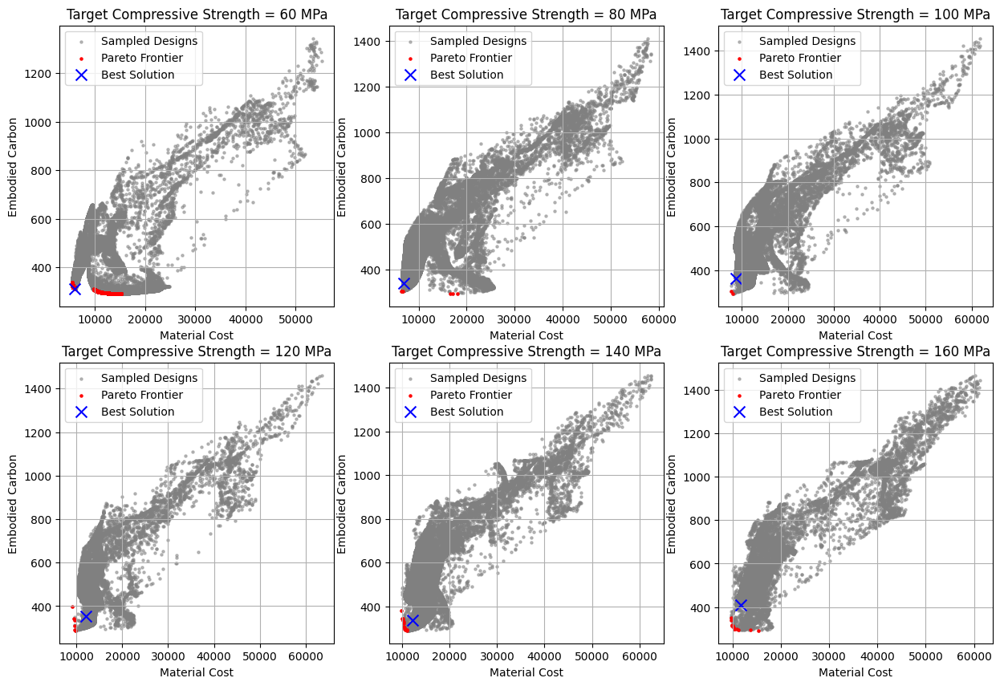

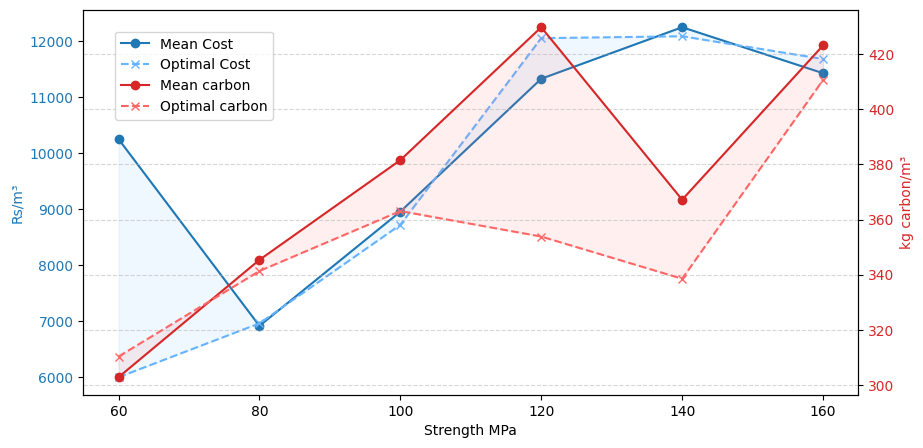

c1= 1 c2= 0.001

Best Solution 60 MPa:
 Cement (kg/m³)  SF (kg/m³)  BFS (kg/m³)   FA (kg/m³)   QP (kg/m³)  LSP (kg/m³)  NS (kg/m³)  Fiber (kg/m³)  Sand (kg/m³)  Gravel (kg/m³)  Water (kg/m³)  SP (kg/m³)    T (°C)    RH (%)  Age (days)  Strength (MPa)  Material Cost (Rs.)  Carbon (kg CO2/kg)
     349.357819   10.449558    66.825485 1.817808e-25 3.222979e-17     42.97718    0.000041   3.282990e-14    387.042816     1113.133789     156.752045    7.156753 20.071697 99.529419     4.99601        61.96887          6236.918701           327.25798

Best Solution 80 MPa:
 Cement (kg/m³)  SF (kg/m³)  BFS (kg/m³)   FA (kg/m³)   QP (kg/m³)  LSP (kg/m³)  NS (kg/m³)  Fiber (kg/m³)  Sand (kg/m³)  Gravel (kg/m³)  Water (kg/m³)  SP (kg/m³)    T (°C)    RH (%)  Age (days)  Strength (MPa)  Material Cost (Rs.)  Carbon (kg CO2/kg)
     360.895844   14.875042    51.726006 1.700458e-09 1.610743e-08     0.416125    0.000015       0.000001    739.876038     1021.735657       161.9543     5.47135 20.502682 99.99

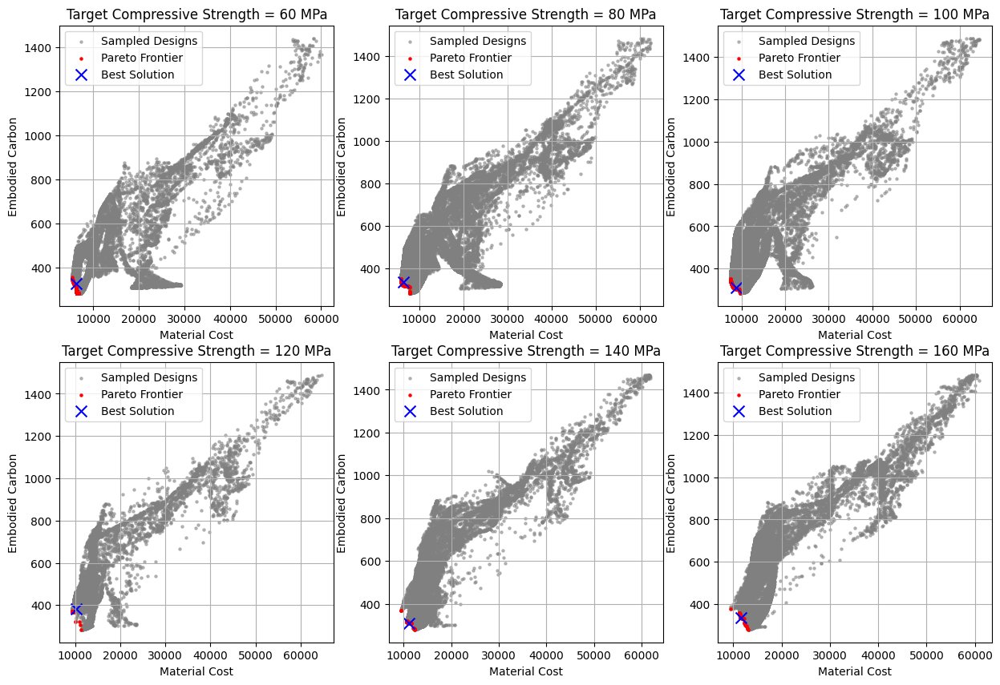

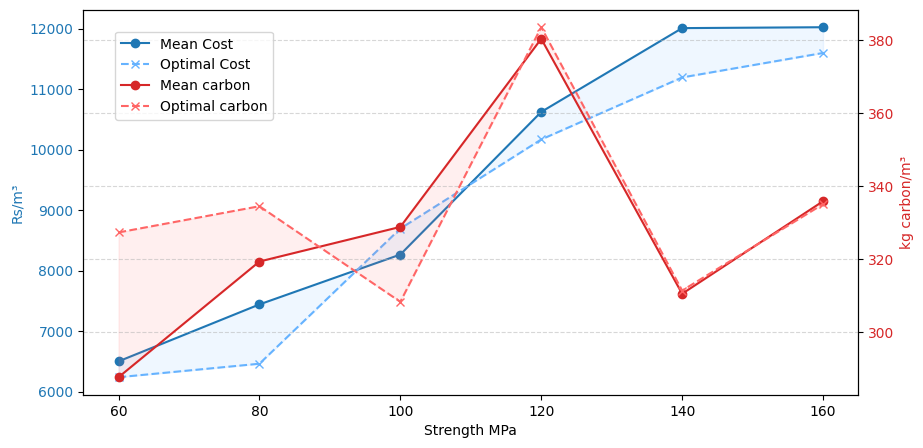

c1= 1 c2= 0.01

Best Solution 60 MPa:
 Cement (kg/m³)  SF (kg/m³)  BFS (kg/m³)  FA (kg/m³)   QP (kg/m³)  LSP (kg/m³)  NS (kg/m³)  Fiber (kg/m³)  Sand (kg/m³)  Gravel (kg/m³)  Water (kg/m³)  SP (kg/m³)    T (°C)    RH (%)  Age (days)  Strength (MPa)  Material Cost (Rs.)  Carbon (kg CO2/kg)
     491.217072    3.045637      3.06998         0.0 1.478533e-19     5.725413    0.005914   2.632256e-22    328.043091     1129.556152     154.580978   10.353296 20.010168 99.660133    2.799559       62.887246          7268.254615          443.235602

Best Solution 80 MPa:
 Cement (kg/m³)  SF (kg/m³)  BFS (kg/m³)   FA (kg/m³)   QP (kg/m³)  LSP (kg/m³)  NS (kg/m³)  Fiber (kg/m³)  Sand (kg/m³)  Gravel (kg/m³)  Water (kg/m³)  SP (kg/m³)    T (°C)    RH (%)  Age (days)  Strength (MPa)  Material Cost (Rs.)  Carbon (kg CO2/kg)
     396.698029   21.235888    51.024563 1.620682e-25 8.091793e-16    64.173981    0.000006   1.204648e-13    491.078552     1103.271606     145.312683   10.900452 20.119709 98.75619

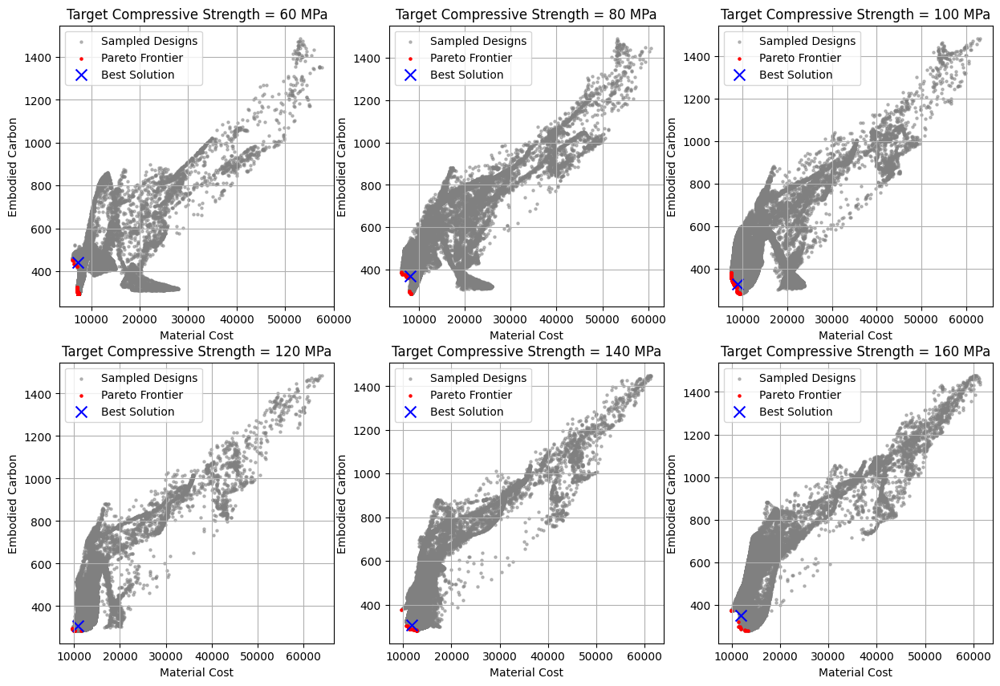

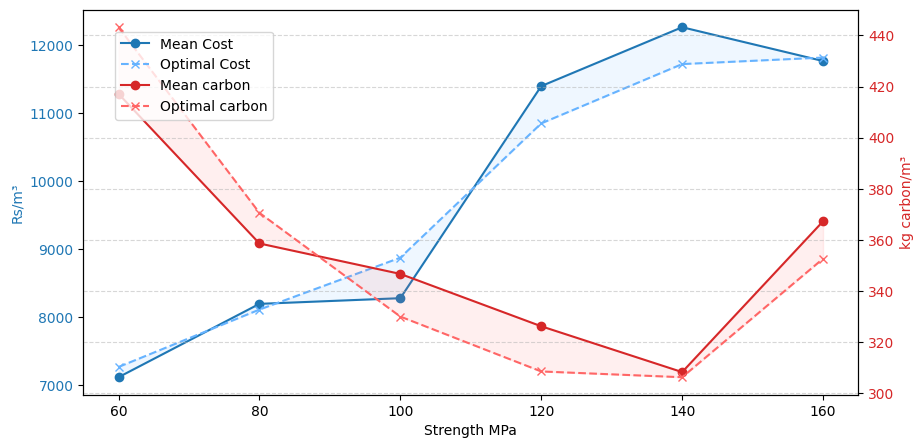

c1= 1 c2= 0.1

Best Solution 60 MPa:
 Cement (kg/m³)  SF (kg/m³)  BFS (kg/m³)   FA (kg/m³)   QP (kg/m³)  LSP (kg/m³)  NS (kg/m³)  Fiber (kg/m³)  Sand (kg/m³)  Gravel (kg/m³)  Water (kg/m³)  SP (kg/m³)    T (°C)    RH (%)  Age (days)  Strength (MPa)  Material Cost (Rs.)  Carbon (kg CO2/kg)
     358.819885    4.859969   145.482529 5.902481e-34 1.470750e-16    67.019432    0.000007   7.334906e-14    426.822632     1078.255371     150.025482   11.080673 20.041264 98.975983    1.869754       58.036454          7261.472048          345.219211

Best Solution 80 MPa:
 Cement (kg/m³)  SF (kg/m³)  BFS (kg/m³)   FA (kg/m³)   QP (kg/m³)  LSP (kg/m³)   NS (kg/m³)  Fiber (kg/m³)  Sand (kg/m³)  Gravel (kg/m³)  Water (kg/m³)  SP (kg/m³)    T (°C)    RH (%)  Age (days)  Strength (MPa)  Material Cost (Rs.)  Carbon (kg CO2/kg)
     349.985596   16.576883    24.841738 3.996035e-23 3.967037e-11    80.620644 7.031682e-07   1.320289e-13    583.843933     1062.562256     145.186737    9.277927 20.185417 98.30

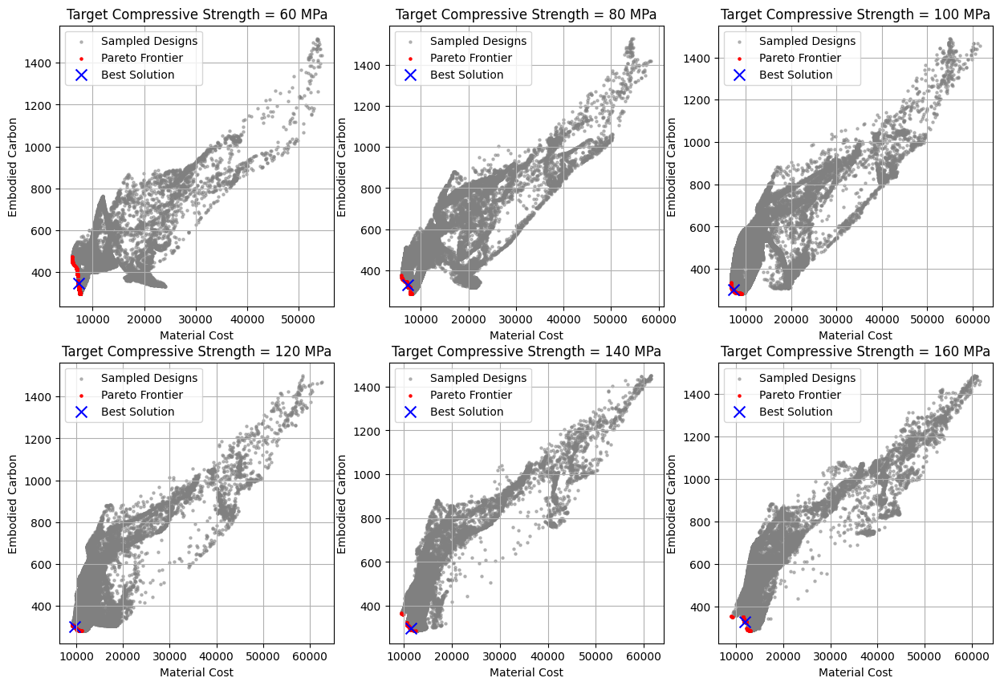

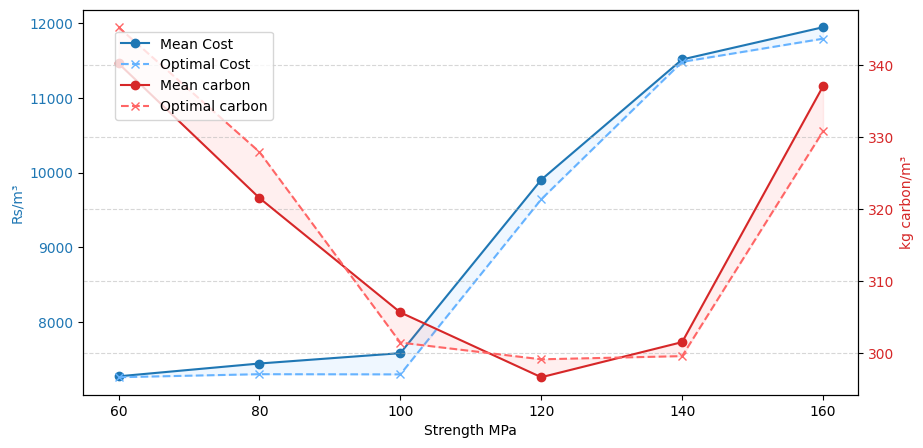

c1= 1 c2= 1

Best Solution 60 MPa:
 Cement (kg/m³)  SF (kg/m³)  BFS (kg/m³)   FA (kg/m³)   QP (kg/m³)  LSP (kg/m³)  NS (kg/m³)  Fiber (kg/m³)  Sand (kg/m³)  Gravel (kg/m³)  Water (kg/m³)  SP (kg/m³)    T (°C)   RH (%)  Age (days)  Strength (MPa)  Material Cost (Rs.)  Carbon (kg CO2/kg)
      392.51239    6.057314    14.592094 1.465266e-31 3.011904e-24    63.644016    0.000003   6.041772e-15    605.209534     1043.567017     130.686356   13.471836 20.708244 98.83654     2.00057       62.080964          8057.251848           365.95559

Best Solution 80 MPa:
 Cement (kg/m³)  SF (kg/m³)  BFS (kg/m³)   FA (kg/m³)   QP (kg/m³)  LSP (kg/m³)   NS (kg/m³)  Fiber (kg/m³)  Sand (kg/m³)  Gravel (kg/m³)  Water (kg/m³)  SP (kg/m³)   T (°C)    RH (%)  Age (days)  Strength (MPa)  Material Cost (Rs.)  Carbon (kg CO2/kg)
     328.457031   10.250028    14.155774 1.503727e-31 2.311005e-19   133.350555 1.408983e-12   1.674926e-11    634.050659     1032.896484     134.442001    12.30126 20.39995 98.159721  

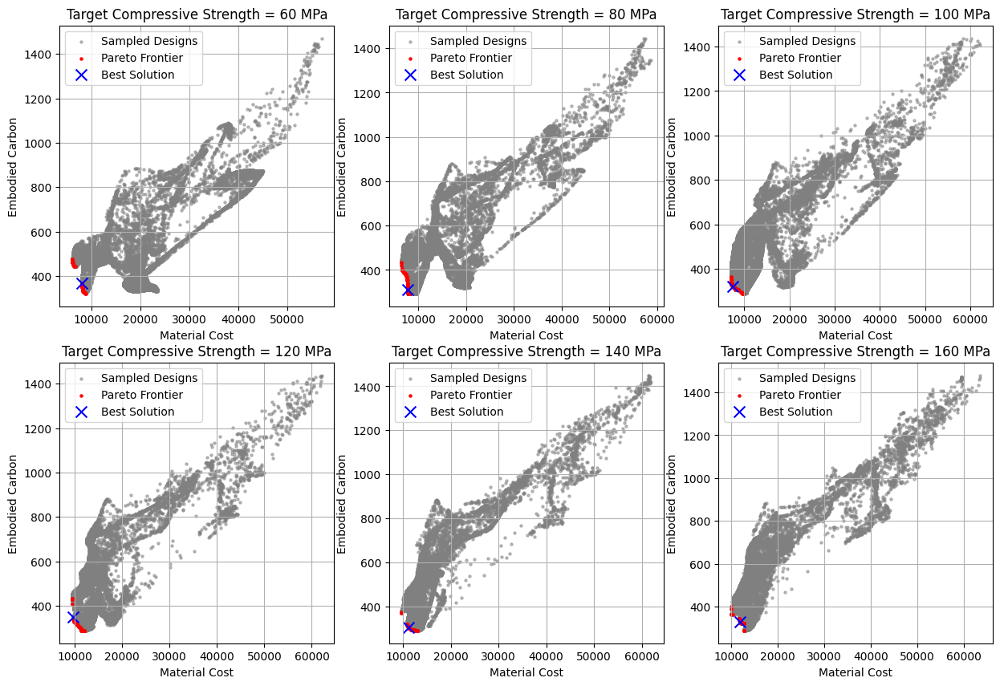

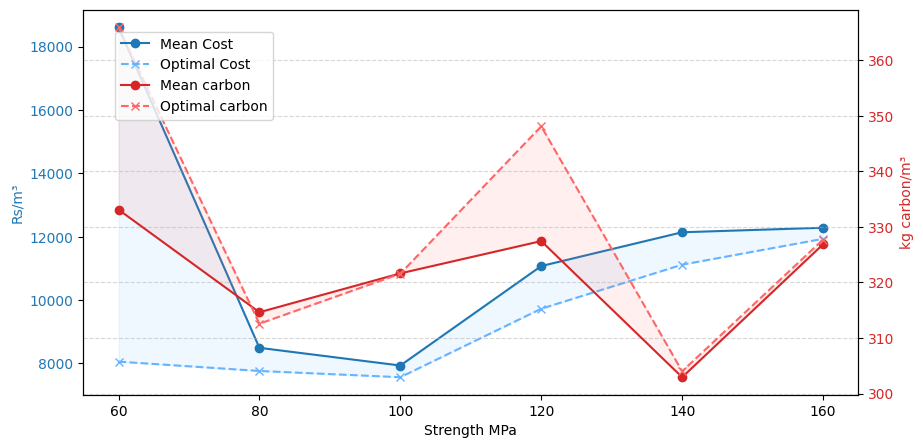

c1= 1 c2= 10

Best Solution 60 MPa:
 Cement (kg/m³)  SF (kg/m³)  BFS (kg/m³)  FA (kg/m³)   QP (kg/m³)  LSP (kg/m³)  NS (kg/m³)  Fiber (kg/m³)  Sand (kg/m³)  Gravel (kg/m³)  Water (kg/m³)  SP (kg/m³)    T (°C)    RH (%)  Age (days)  Strength (MPa)  Material Cost (Rs.)  Carbon (kg CO2/kg)
     447.810822   36.053154   331.539612    6.170122 4.764280e-10 1.084685e-09    0.000057   8.782662e-08    755.020935      361.898224     174.011627   11.007093 20.922819 99.998795    4.990253       60.318998          9472.549501          425.247806

Best Solution 80 MPa:
 Cement (kg/m³)  SF (kg/m³)  BFS (kg/m³)   FA (kg/m³)   QP (kg/m³)  LSP (kg/m³)   NS (kg/m³)  Fiber (kg/m³)  Sand (kg/m³)  Gravel (kg/m³)  Water (kg/m³)  SP (kg/m³)   T (°C)    RH (%)  Age (days)  Strength (MPa)  Material Cost (Rs.)  Carbon (kg CO2/kg)
     406.475586    5.348839     0.002047 2.832874e-26 2.891413e-14    64.204948 9.110512e-14   2.634375e-11    626.581421     1037.005127      134.87796   11.526381 22.00057 98.972725 

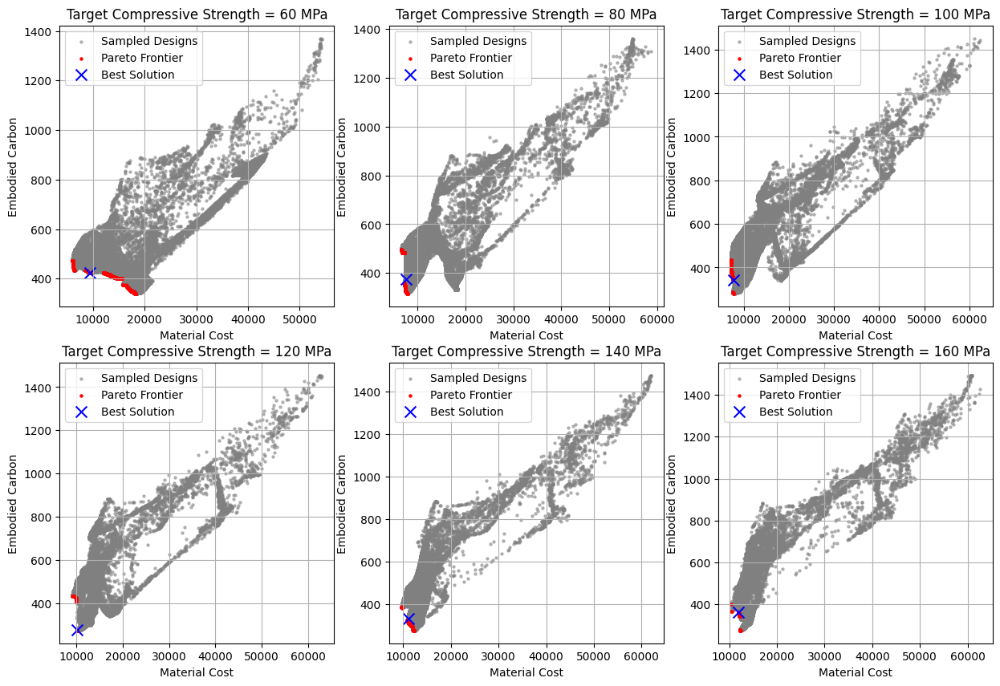

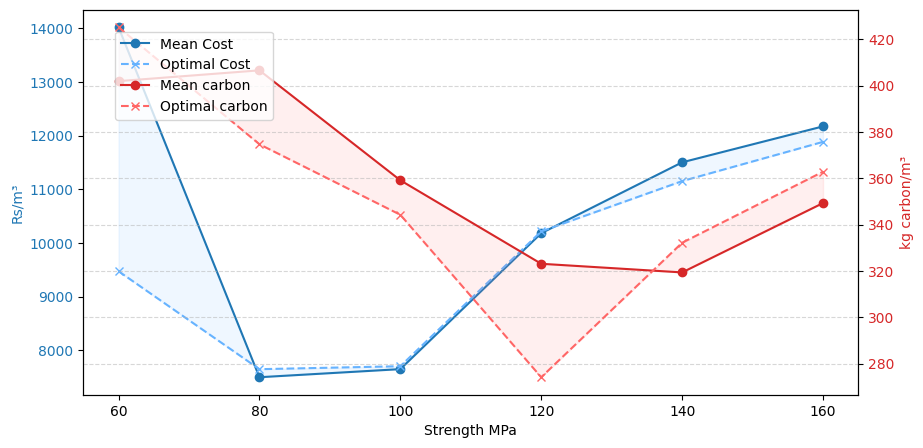

c1= 1 c2= 100

Best Solution 60 MPa:
 Cement (kg/m³)  SF (kg/m³)  BFS (kg/m³)  FA (kg/m³)   QP (kg/m³)  LSP (kg/m³)  NS (kg/m³)  Fiber (kg/m³)  Sand (kg/m³)  Gravel (kg/m³)  Water (kg/m³)  SP (kg/m³)    T (°C)   RH (%)  Age (days)  Strength (MPa)  Material Cost (Rs.)  Carbon (kg CO2/kg)
     454.235931   19.481289    76.611916    0.342524 5.722385e-13 5.455101e-12    0.000057   6.187046e-10    713.335083      885.079529     164.677658    7.379943 20.820393 99.99955    6.010289        58.64282          7640.321104          414.397927

Best Solution 80 MPa:
 Cement (kg/m³)  SF (kg/m³)  BFS (kg/m³)   FA (kg/m³)   QP (kg/m³)  LSP (kg/m³)   NS (kg/m³)  Fiber (kg/m³)  Sand (kg/m³)  Gravel (kg/m³)  Water (kg/m³)  SP (kg/m³)    T (°C)    RH (%)  Age (days)  Strength (MPa)  Material Cost (Rs.)  Carbon (kg CO2/kg)
     373.351349    6.952909    64.161377 3.528114e-32 1.311125e-22    97.135696 4.159767e-14   2.506136e-15     617.71637     1005.933777     134.084122   13.005791 20.803627 98.203148

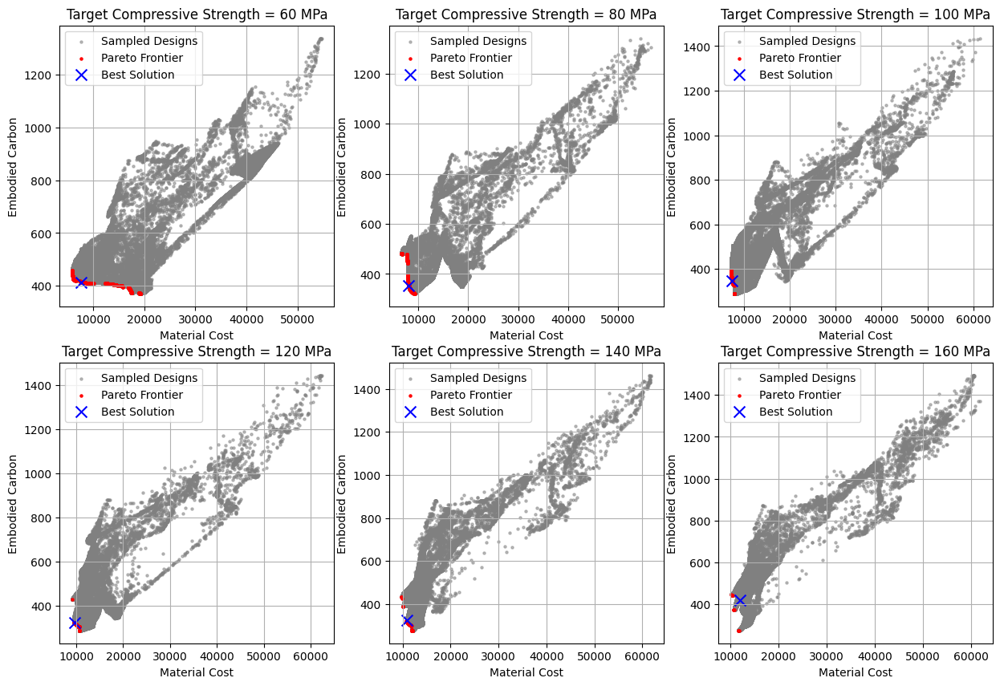

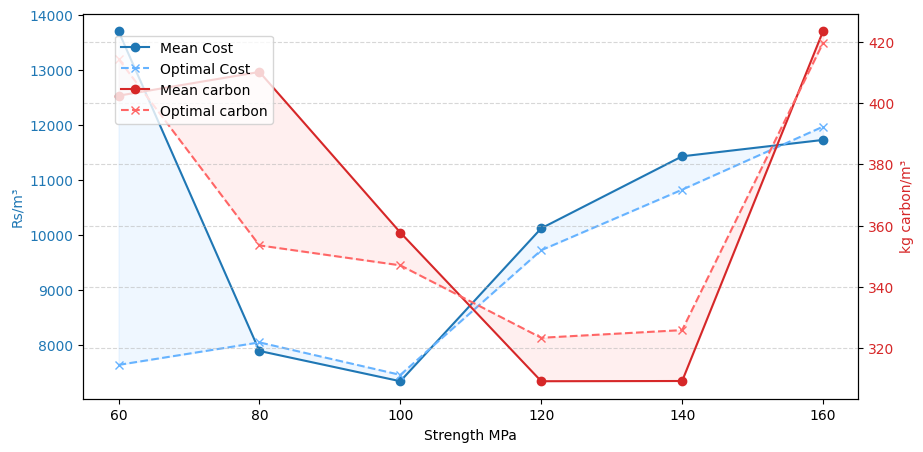

c1= 0.1 c2= 0.0001

Best Solution 60 MPa:
 Cement (kg/m³)  SF (kg/m³)  BFS (kg/m³)  FA (kg/m³)   QP (kg/m³)  LSP (kg/m³)  NS (kg/m³)  Fiber (kg/m³)  Sand (kg/m³)  Gravel (kg/m³)  Water (kg/m³)  SP (kg/m³)    T (°C)    RH (%)  Age (days)  Strength (MPa)  Material Cost (Rs.)  Carbon (kg CO2/kg)
     450.468933   21.599199    13.654569    3.088382 1.035470e-13 1.034086e-13     0.00004   6.534436e-14    740.535889      831.142273     166.237762    6.990192 20.481415 99.995163    7.699828       62.273467          7480.141217          405.232856

Best Solution 80 MPa:
 Cement (kg/m³)  SF (kg/m³)  BFS (kg/m³)   FA (kg/m³)   QP (kg/m³)  LSP (kg/m³)   NS (kg/m³)  Fiber (kg/m³)  Sand (kg/m³)  Gravel (kg/m³)  Water (kg/m³)  SP (kg/m³)    T (°C)    RH (%)  Age (days)  Strength (MPa)  Material Cost (Rs.)  Carbon (kg CO2/kg)
     465.487061    1.841241    24.629206 6.391536e-33 1.351927e-19    34.626228 1.813596e-15   5.119753e-13    595.346191     1046.265747     146.387207   11.868938 21.699518 98

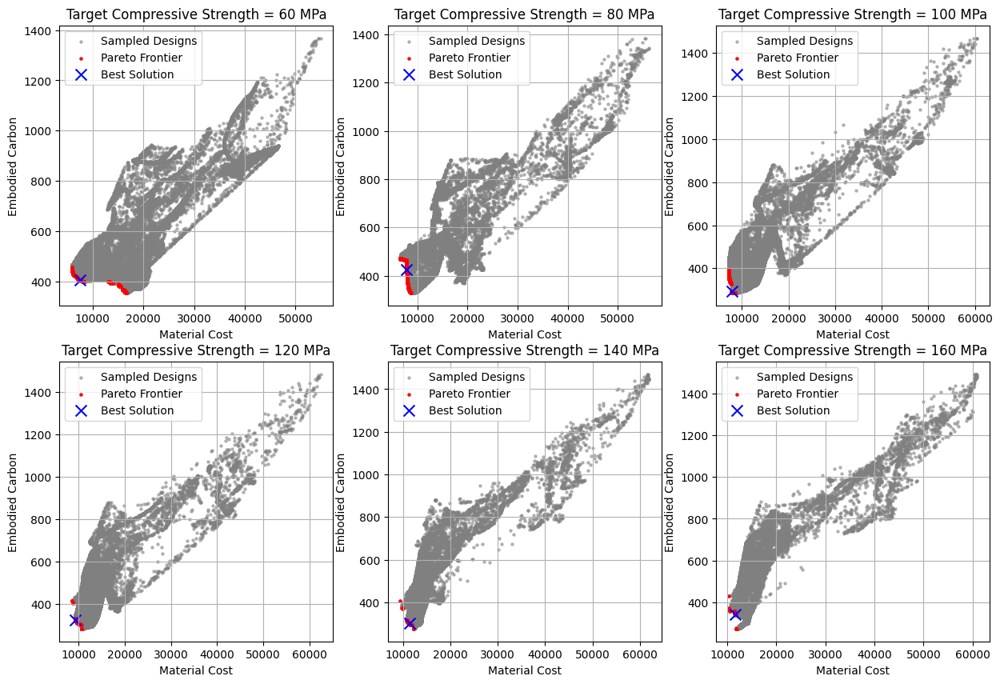

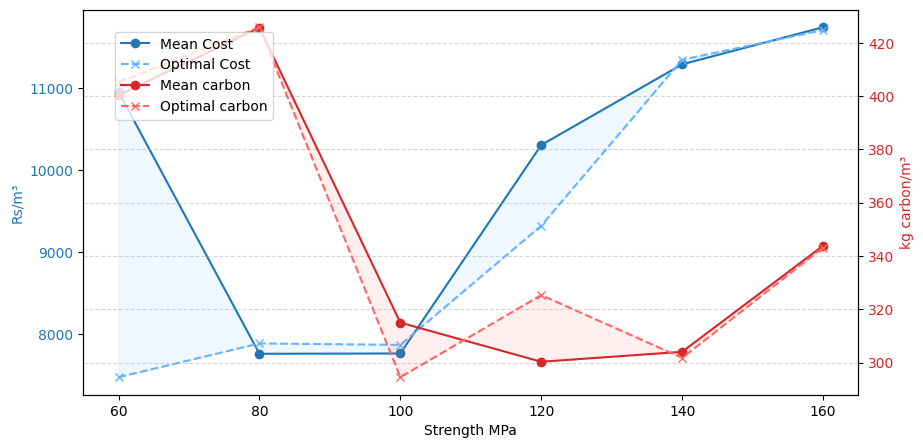

c1= 0.1 c2= 0.001

Best Solution 60 MPa:
 Cement (kg/m³)  SF (kg/m³)  BFS (kg/m³)  FA (kg/m³)   QP (kg/m³)  LSP (kg/m³)   NS (kg/m³)  Fiber (kg/m³)  Sand (kg/m³)  Gravel (kg/m³)  Water (kg/m³)  SP (kg/m³)    T (°C)    RH (%)  Age (days)  Strength (MPa)  Material Cost (Rs.)  Carbon (kg CO2/kg)
     468.680878   47.337009    20.957941   47.296936 8.160726e-18 2.561713e-20 5.252713e-07   1.856478e-16    821.364868      382.719482     178.894745    9.498303 20.389105 99.440849     2.65262       59.182377          9252.476498          417.815123

Best Solution 80 MPa:
 Cement (kg/m³)  SF (kg/m³)  BFS (kg/m³)   FA (kg/m³)   QP (kg/m³)  LSP (kg/m³)   NS (kg/m³)  Fiber (kg/m³)  Sand (kg/m³)  Gravel (kg/m³)  Water (kg/m³)  SP (kg/m³)    T (°C)    RH (%)  Age (days)  Strength (MPa)  Material Cost (Rs.)  Carbon (kg CO2/kg)
     476.831573    1.588965    19.241966 1.536209e-36 4.476785e-30    28.275776 3.519012e-15   3.883619e-17    610.668579     1055.429932     148.773514   10.662917 21.518316 9

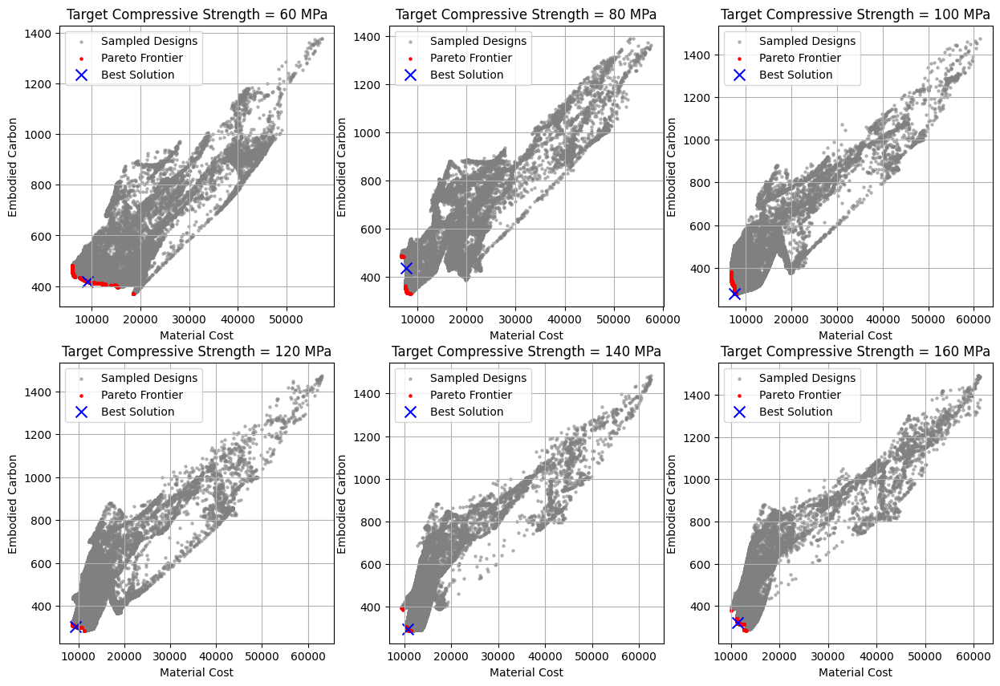

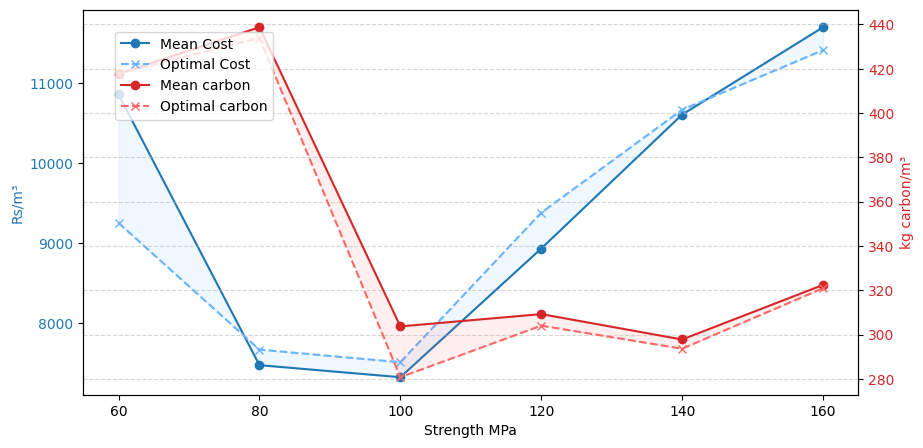

c1= 0.1 c2= 0.01

Best Solution 60 MPa:
 Cement (kg/m³)  SF (kg/m³)  BFS (kg/m³)  FA (kg/m³)  QP (kg/m³)  LSP (kg/m³)   NS (kg/m³)  Fiber (kg/m³)  Sand (kg/m³)  Gravel (kg/m³)  Water (kg/m³)  SP (kg/m³)    T (°C)  RH (%)  Age (days)  Strength (MPa)  Material Cost (Rs.)  Carbon (kg CO2/kg)
     421.381744   25.953152 5.074511e-22    0.008881    1.875958     0.016169 7.860886e-14       0.881968    782.082336    1.532818e-21     170.931061   25.794033 20.204529   100.0     1.62301       57.724548         11491.691816           386.74284

Best Solution 80 MPa:
 Cement (kg/m³)  SF (kg/m³)  BFS (kg/m³)   FA (kg/m³)  QP (kg/m³)  LSP (kg/m³)   NS (kg/m³)  Fiber (kg/m³)  Sand (kg/m³)  Gravel (kg/m³)  Water (kg/m³)  SP (kg/m³)    T (°C)    RH (%)  Age (days)  Strength (MPa)  Material Cost (Rs.)  Carbon (kg CO2/kg)
     371.385071    17.28479    56.612644 1.561498e-27         0.0    90.918137 9.313754e-23   1.267583e-25    652.388306     1008.704407      140.76799   11.570763 21.984724 99.000404 

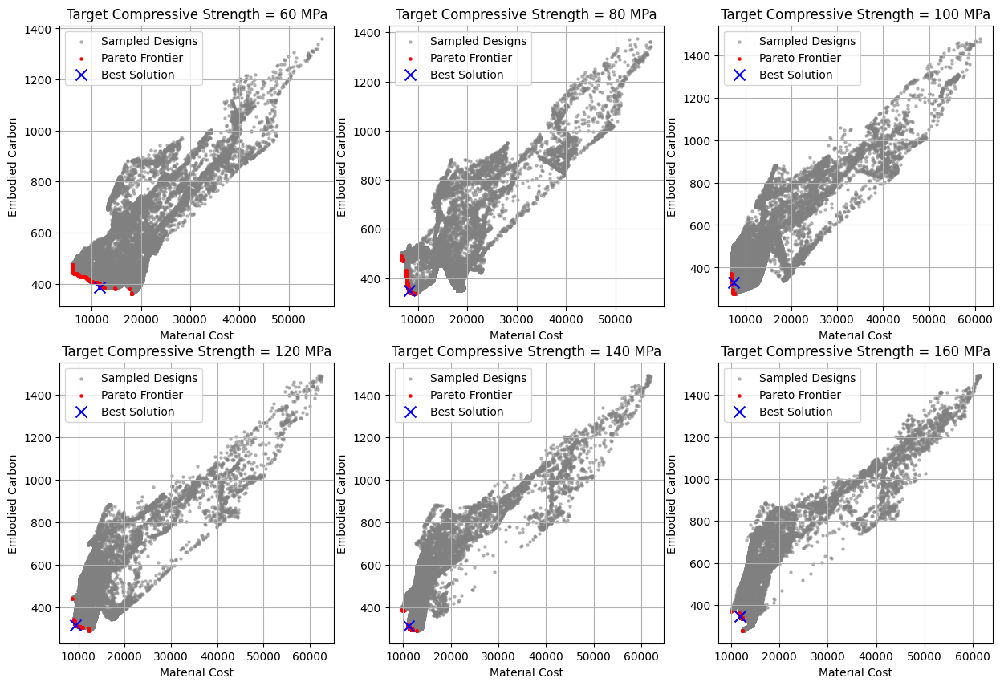

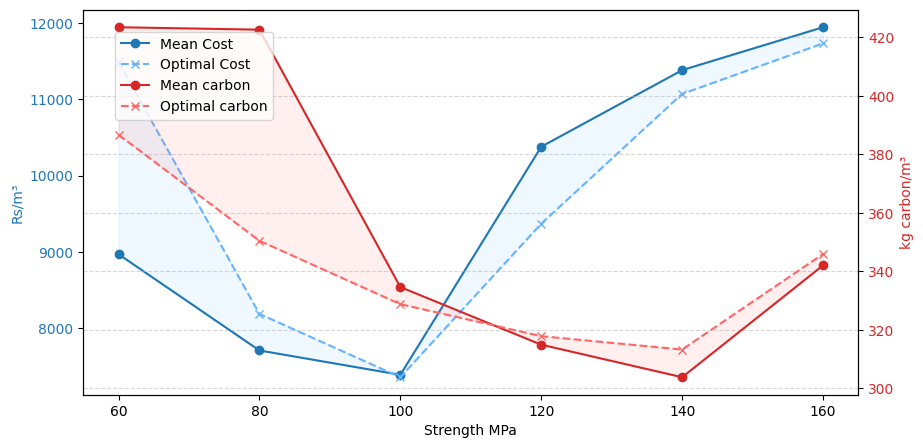

c1= 0.1 c2= 0.1

Best Solution 60 MPa:
 Cement (kg/m³)  SF (kg/m³)  BFS (kg/m³)  FA (kg/m³)  QP (kg/m³)  LSP (kg/m³)   NS (kg/m³)  Fiber (kg/m³)  Sand (kg/m³)  Gravel (kg/m³)  Water (kg/m³)  SP (kg/m³)    T (°C)  RH (%)  Age (days)  Strength (MPa)  Material Cost (Rs.)  Carbon (kg CO2/kg)
     399.782837    6.019267 3.203128e-22    0.000077    4.656063     0.171337 2.942023e-11       0.371615   1017.416443    1.380757e-19      175.18129    34.73682 20.385334   100.0    2.210488       58.231791         12902.936789          376.847277

Best Solution 80 MPa:
 Cement (kg/m³)  SF (kg/m³)  BFS (kg/m³)   FA (kg/m³)  QP (kg/m³)  LSP (kg/m³)   NS (kg/m³)  Fiber (kg/m³)  Sand (kg/m³)  Gravel (kg/m³)  Water (kg/m³)  SP (kg/m³)    T (°C)    RH (%)  Age (days)  Strength (MPa)  Material Cost (Rs.)  Carbon (kg CO2/kg)
      502.80896    0.862318     2.122965 2.244396e-31         0.0    17.380354 6.808180e-11   3.466820e-18    661.604919     1064.141357     137.838379    9.047519 20.615017 99.009613  

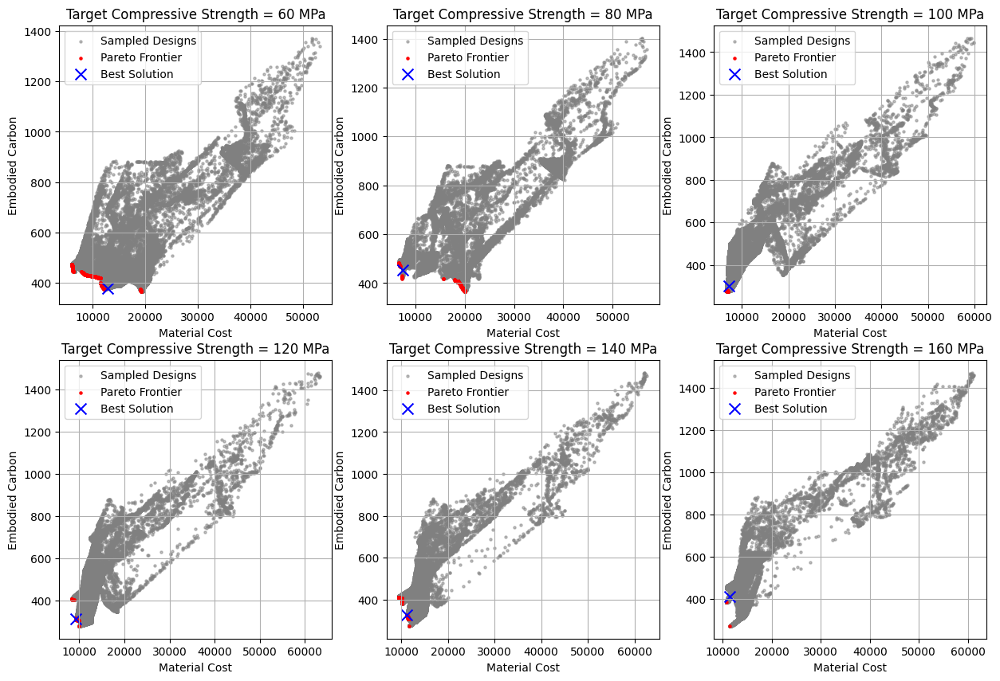

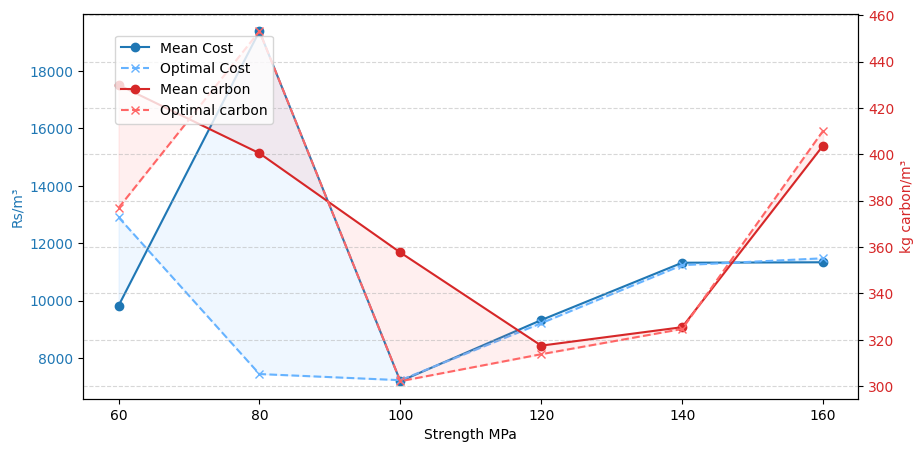

c1= 0.1 c2= 1

Best Solution 60 MPa:
 Cement (kg/m³)  SF (kg/m³)  BFS (kg/m³)  FA (kg/m³)   QP (kg/m³)  LSP (kg/m³)  NS (kg/m³)  Fiber (kg/m³)  Sand (kg/m³)  Gravel (kg/m³)  Water (kg/m³)  SP (kg/m³)    T (°C)  RH (%)  Age (days)  Strength (MPa)  Material Cost (Rs.)  Carbon (kg CO2/kg)
     495.652191    1.922531     2.706076    0.000005 1.021638e-17 9.520140e-19    0.001738   6.720916e-08    776.487061     1039.815308     162.327118    5.458342 20.642649   100.0    7.429345        59.76617          6700.491048          443.866456

Best Solution 80 MPa:
 Cement (kg/m³)  SF (kg/m³)  BFS (kg/m³)  FA (kg/m³)   QP (kg/m³)  LSP (kg/m³)  NS (kg/m³)  Fiber (kg/m³)  Sand (kg/m³)  Gravel (kg/m³)  Water (kg/m³)  SP (kg/m³)    T (°C)  RH (%)  Age (days)  Strength (MPa)  Material Cost (Rs.)  Carbon (kg CO2/kg)
     500.982269    0.000122          0.0  355.168152 6.911083e-19 1.574984e-13    1.271242            0.0    803.892944    8.512416e-07     159.856354   23.223291 25.162146   100.0    1.7209

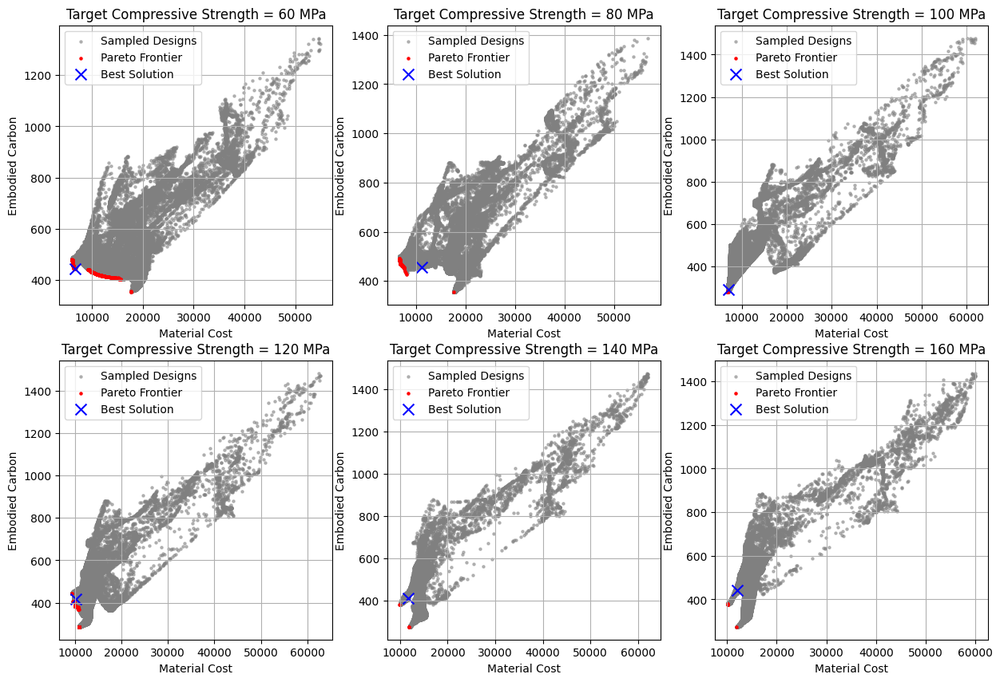

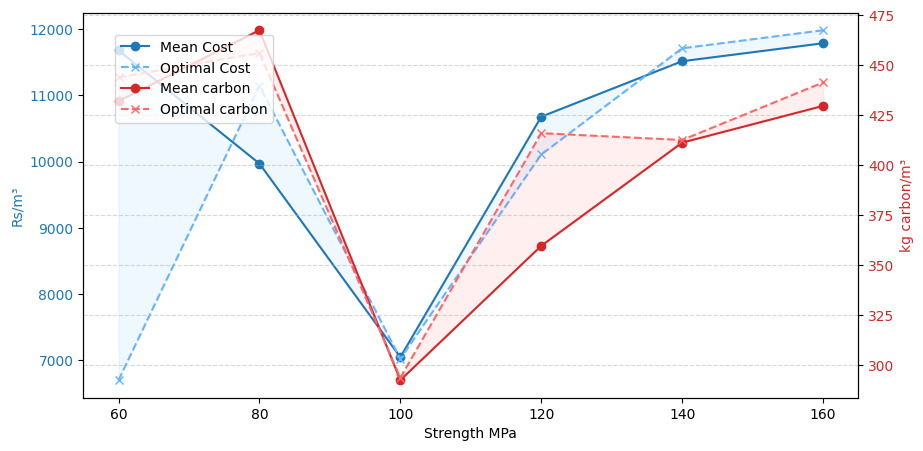

c1= 0.1 c2= 10

Best Solution 60 MPa:
 Cement (kg/m³)  SF (kg/m³)  BFS (kg/m³)  FA (kg/m³)   QP (kg/m³)  LSP (kg/m³)  NS (kg/m³)  Fiber (kg/m³)  Sand (kg/m³)  Gravel (kg/m³)  Water (kg/m³)  SP (kg/m³)    T (°C)    RH (%)  Age (days)  Strength (MPa)  Material Cost (Rs.)  Carbon (kg CO2/kg)
     440.812744   13.138609    35.401863   94.757507 1.657507e-28 1.740821e-30    0.000003   8.386463e-10    905.302917      236.440338     174.565643   11.632175 20.137165 99.811592    4.956007       60.941682          8166.016442          394.977383

Best Solution 80 MPa:
 Cement (kg/m³)  SF (kg/m³)  BFS (kg/m³)  FA (kg/m³)  QP (kg/m³)  LSP (kg/m³)  NS (kg/m³)  Fiber (kg/m³)  Sand (kg/m³)  Gravel (kg/m³)  Water (kg/m³)  SP (kg/m³)   T (°C)  RH (%)  Age (days)  Strength (MPa)  Material Cost (Rs.)  Carbon (kg CO2/kg)
     346.122742  122.944069        375.0  186.242981         0.0     2.489122    0.001098   2.133741e-14   1027.518555    3.296439e-30     176.452927   25.263985 20.00589   100.0     8.44

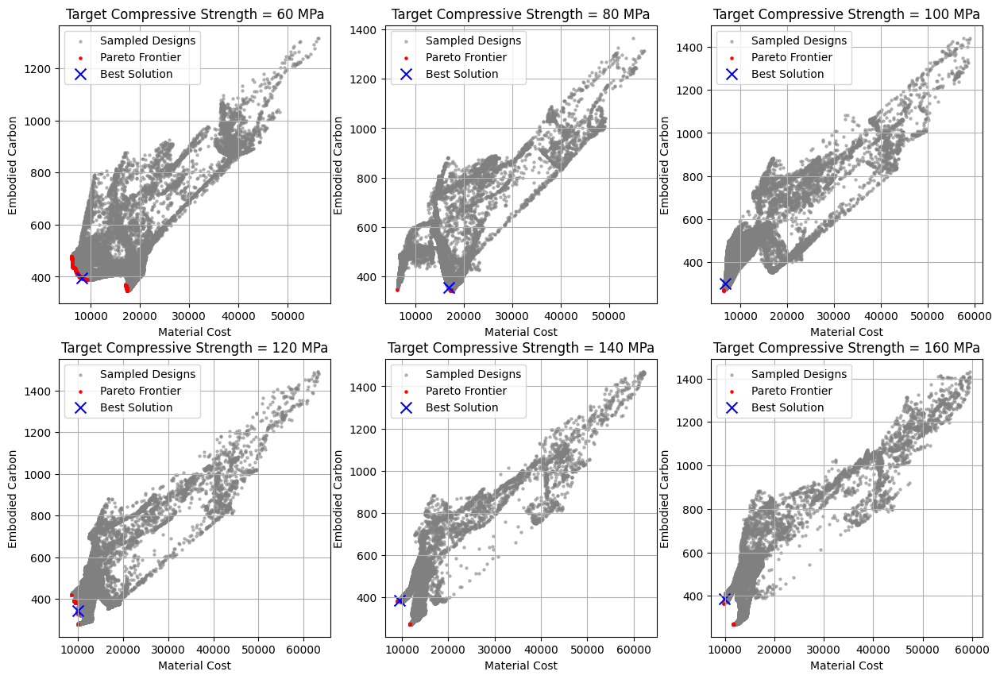

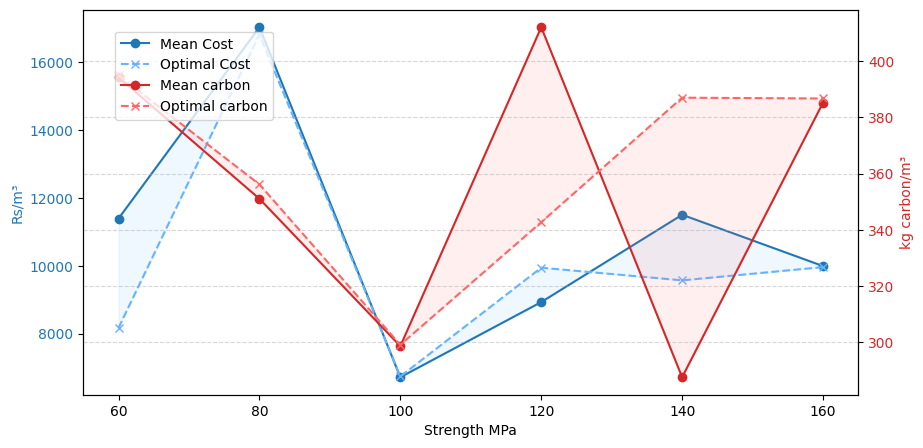

c1= 0.1 c2= 100

Best Solution 60 MPa:
 Cement (kg/m³)  SF (kg/m³)  BFS (kg/m³)  FA (kg/m³)   QP (kg/m³)  LSP (kg/m³)   NS (kg/m³)  Fiber (kg/m³)  Sand (kg/m³)  Gravel (kg/m³)  Water (kg/m³)  SP (kg/m³)    T (°C)    RH (%)  Age (days)  Strength (MPa)  Material Cost (Rs.)  Carbon (kg CO2/kg)
     472.886475   25.365812    47.880455  110.616745 1.799415e-26          0.0 8.479029e-07   1.838743e-07    872.645569      194.478851     169.660187   11.935328 20.075115 99.999939    4.964661       62.573785          8980.633308          422.731843

Best Solution 80 MPa:
 Cement (kg/m³)  SF (kg/m³)  BFS (kg/m³)  FA (kg/m³)  QP (kg/m³)  LSP (kg/m³)  NS (kg/m³)  Fiber (kg/m³)  Sand (kg/m³)  Gravel (kg/m³)  Water (kg/m³)  SP (kg/m³)    T (°C)    RH (%)  Age (days)  Strength (MPa)  Material Cost (Rs.)  Carbon (kg CO2/kg)
     482.091644    6.584821 2.556535e-14    0.000003    0.080684    10.934388    4.422386       0.000002    794.106567      1028.41748     163.321671   10.375325 21.070332 99.605835

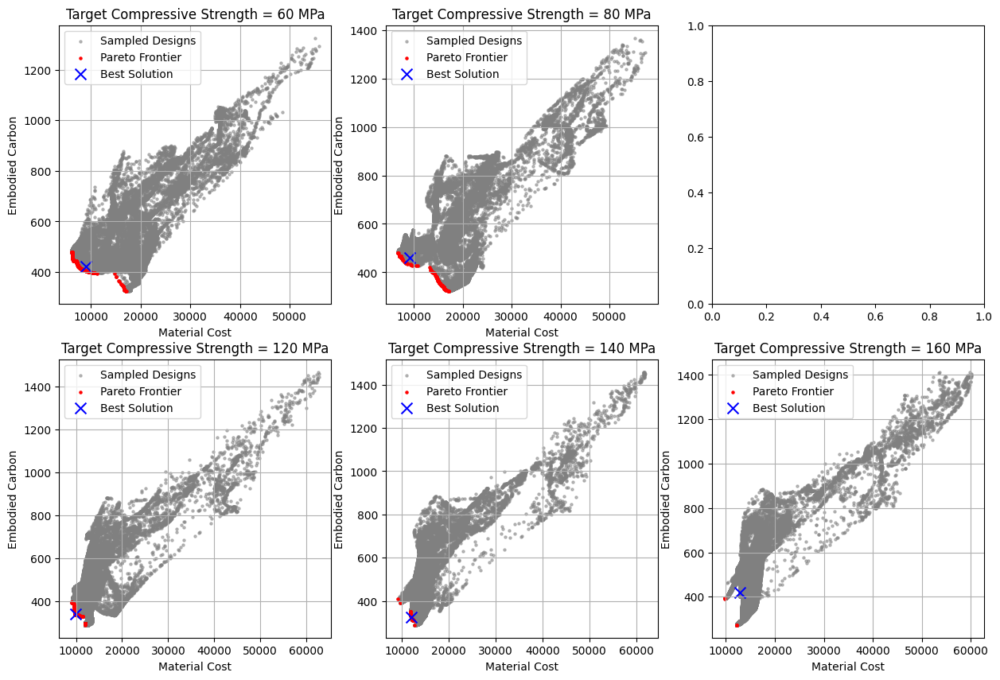

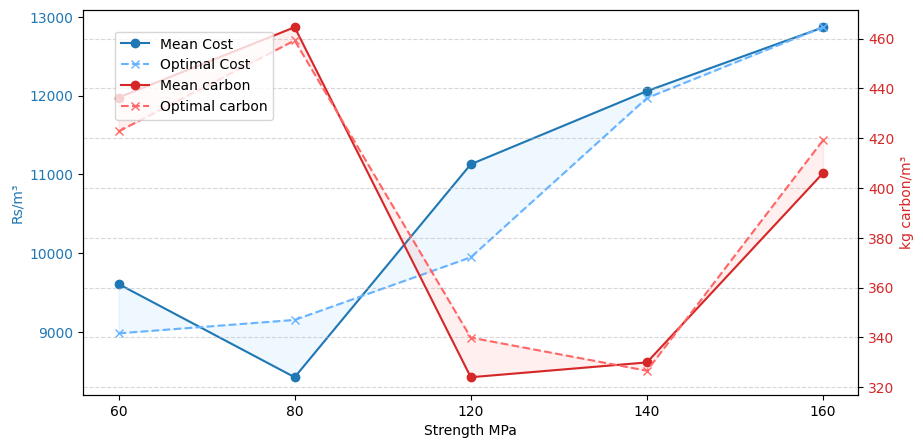

c1= 0.01 c2= 0.0001

Best Solution 60 MPa:
 Cement (kg/m³)  SF (kg/m³)  BFS (kg/m³)  FA (kg/m³)   QP (kg/m³)  LSP (kg/m³)   NS (kg/m³)  Fiber (kg/m³)  Sand (kg/m³)  Gravel (kg/m³)  Water (kg/m³)  SP (kg/m³)    T (°C)    RH (%)  Age (days)  Strength (MPa)  Material Cost (Rs.)  Carbon (kg CO2/kg)
     487.281006   21.823078    34.072151  103.779358 2.054094e-27 1.271250e-34 5.413584e-07       0.000002    888.215393      170.624664     173.513336     7.58461 20.135466 99.999962    4.812431       61.818869          7828.517167          429.223374

Best Solution 80 MPa:
 Cement (kg/m³)  SF (kg/m³)  BFS (kg/m³)   FA (kg/m³)  QP (kg/m³)  LSP (kg/m³)   NS (kg/m³)  Fiber (kg/m³)  Sand (kg/m³)  Gravel (kg/m³)  Water (kg/m³)  SP (kg/m³)    T (°C)    RH (%)  Age (days)  Strength (MPa)  Material Cost (Rs.)  Carbon (kg CO2/kg)
     353.078033     1.11327     1.008025 2.207336e-14         0.0     7.209012 1.383218e-27   6.977855e-20      633.9646     1053.383911     142.668777    8.009234 20.454695 9

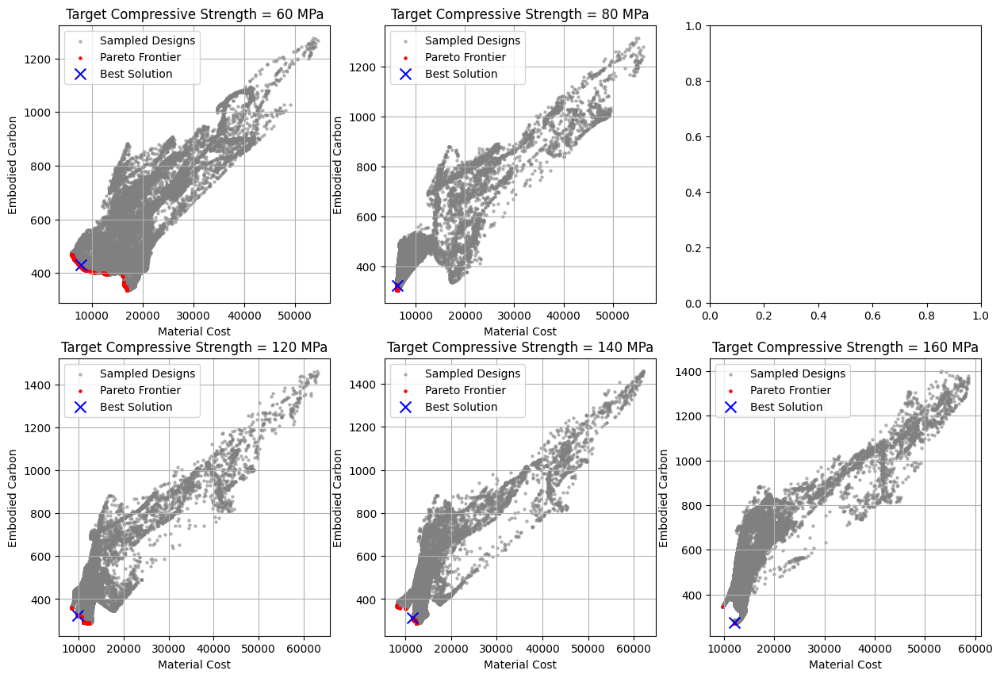

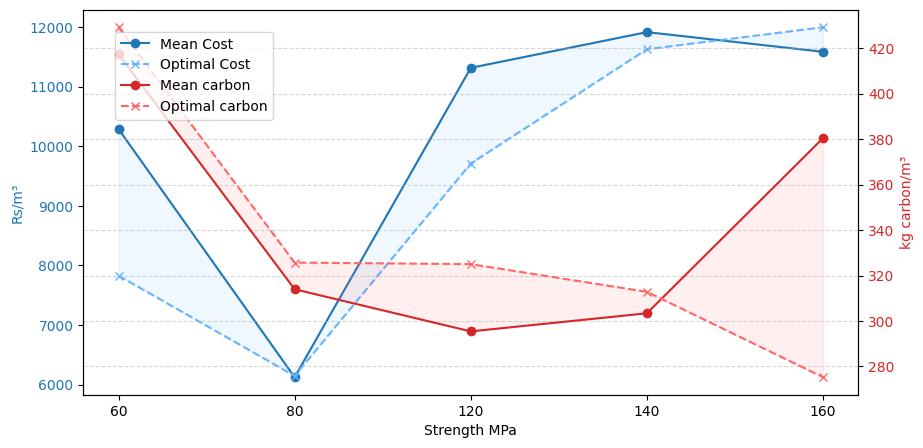

c1= 0.01 c2= 0.001

Best Solution 60 MPa:
 Cement (kg/m³)  SF (kg/m³)  BFS (kg/m³)  FA (kg/m³)   QP (kg/m³)  LSP (kg/m³)   NS (kg/m³)  Fiber (kg/m³)  Sand (kg/m³)  Gravel (kg/m³)  Water (kg/m³)  SP (kg/m³)    T (°C)    RH (%)  Age (days)  Strength (MPa)  Material Cost (Rs.)  Carbon (kg CO2/kg)
     500.335022   35.820438    49.427971   70.244507 1.275635e-20 2.303905e-34 3.962453e-07       0.003619    847.783508      226.057617     171.460709    6.442876 20.492485 99.999466    4.066856       57.838869          8227.423724          441.242299

Best Solution 80 MPa:
 Cement (kg/m³)  SF (kg/m³)  BFS (kg/m³)   FA (kg/m³)   QP (kg/m³)  LSP (kg/m³)   NS (kg/m³)  Fiber (kg/m³)  Sand (kg/m³)  Gravel (kg/m³)  Water (kg/m³)  SP (kg/m³)   T (°C)    RH (%)  Age (days)  Strength (MPa)  Material Cost (Rs.)  Carbon (kg CO2/kg)
     497.128998   15.686689    17.228827 6.608880e-18 4.225347e-29    54.140629 4.444806e-20   2.000162e-08    656.744141     1069.015747     145.920242     9.48435 31.10494 97

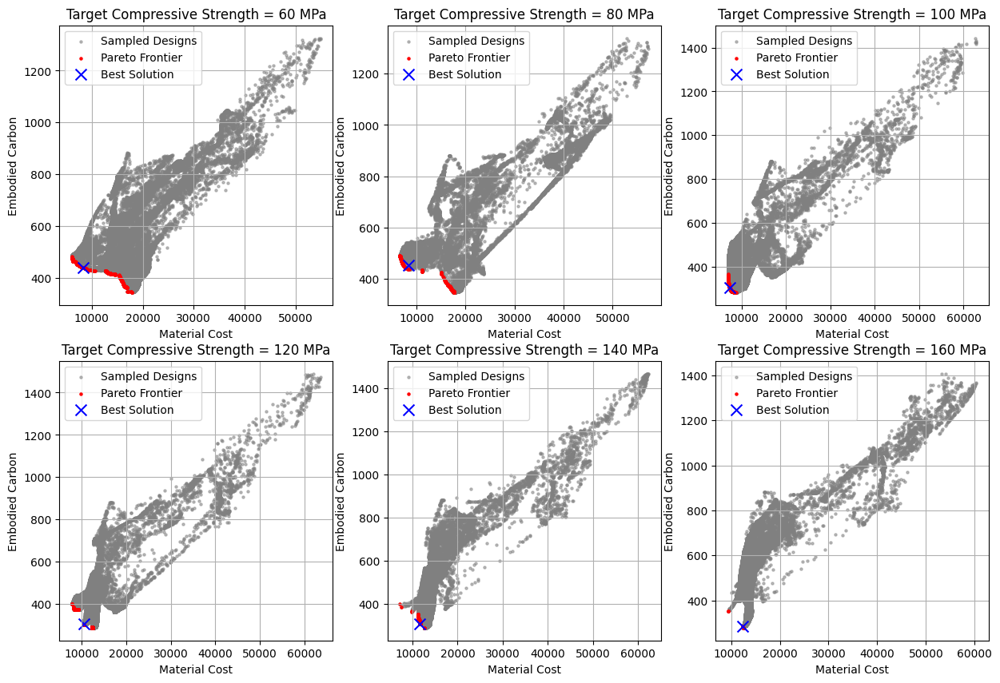

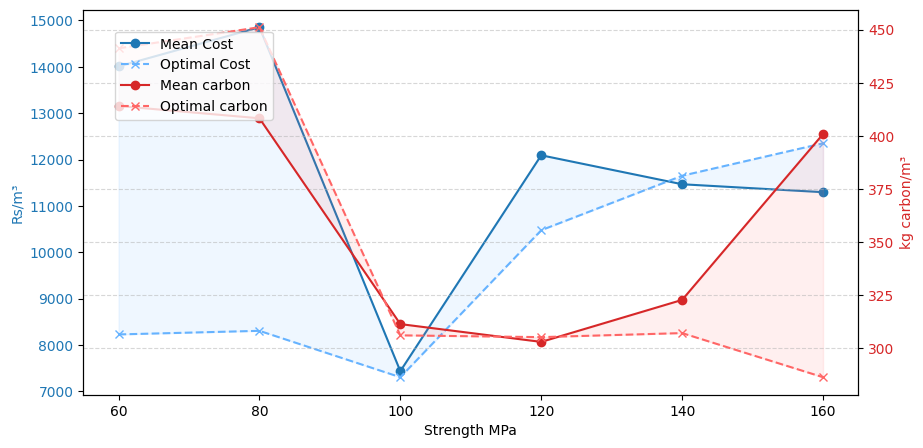

c1= 0.01 c2= 0.01

Best Solution 60 MPa:
 Cement (kg/m³)  SF (kg/m³)  BFS (kg/m³)  FA (kg/m³)  QP (kg/m³)  LSP (kg/m³)   NS (kg/m³)  Fiber (kg/m³)  Sand (kg/m³)  Gravel (kg/m³)  Water (kg/m³)  SP (kg/m³)    T (°C)  RH (%)  Age (days)  Strength (MPa)  Material Cost (Rs.)  Carbon (kg CO2/kg)
     439.478607    3.563106 4.605954e-19    0.002959    9.603926      0.05137 1.018515e-17       5.382446   1123.920166    2.552565e-28      177.57608   29.665115 20.145676   100.0    2.627544       57.186009         12692.921214          418.735133

Best Solution 80 MPa:
 Cement (kg/m³)  SF (kg/m³)  BFS (kg/m³)  FA (kg/m³)   QP (kg/m³)  LSP (kg/m³)  NS (kg/m³)  Fiber (kg/m³)  Sand (kg/m³)  Gravel (kg/m³)  Water (kg/m³)  SP (kg/m³)    T (°C)    RH (%)  Age (days)  Strength (MPa)  Material Cost (Rs.)  Carbon (kg CO2/kg)
     510.567566    0.178098     0.028415    0.000001 2.793030e-10     0.030472    0.730331       0.305115    737.287415     1059.033081     162.521194    7.070265 21.508148 99.933945  

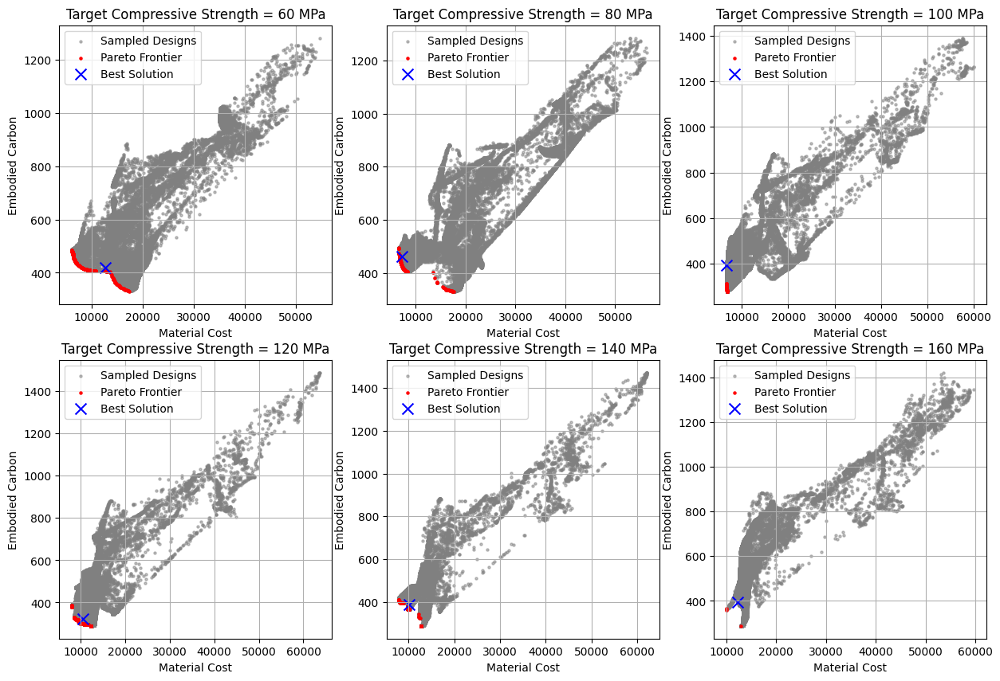

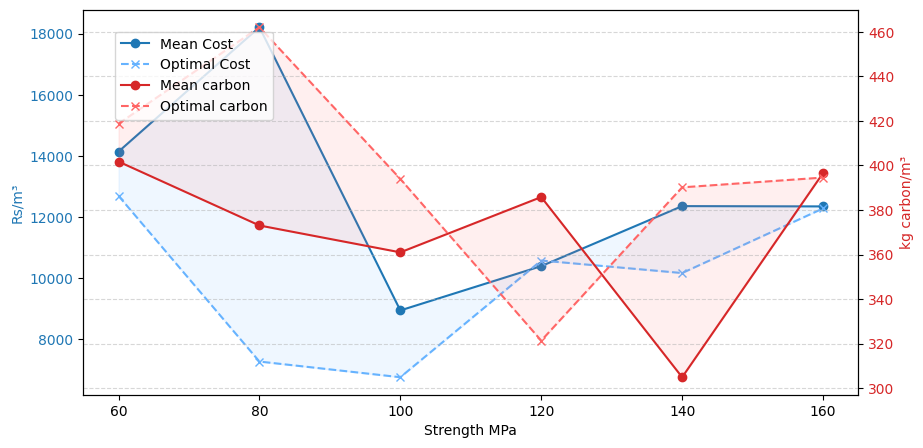

c1= 0.01 c2= 0.1

Best Solution 60 MPa:
 Cement (kg/m³)  SF (kg/m³)  BFS (kg/m³)  FA (kg/m³)  QP (kg/m³)  LSP (kg/m³)  NS (kg/m³)  Fiber (kg/m³)  Sand (kg/m³)  Gravel (kg/m³)  Water (kg/m³)  SP (kg/m³)    T (°C)  RH (%)  Age (days)  Strength (MPa)  Material Cost (Rs.)  Carbon (kg CO2/kg)
     388.666168   22.259825        375.0  181.619904         0.0 1.644991e-08    0.000007   3.015853e-07   1008.583862    4.682844e-22     177.308289   28.634586 20.234022   100.0    4.039985       57.322534         13255.380491          391.885949

Best Solution 80 MPa:
 Cement (kg/m³)  SF (kg/m³)  BFS (kg/m³)  FA (kg/m³)  QP (kg/m³)  LSP (kg/m³)   NS (kg/m³)  Fiber (kg/m³)  Sand (kg/m³)  Gravel (kg/m³)  Water (kg/m³)  SP (kg/m³)    T (°C)    RH (%)  Age (days)  Strength (MPa)  Material Cost (Rs.)  Carbon (kg CO2/kg)
      409.02005    1.416263     6.922122    9.317179         0.0     4.273865 1.575881e-19   4.211451e-09    690.080139     1062.120605     141.373199   11.025245 20.859602 96.459236     

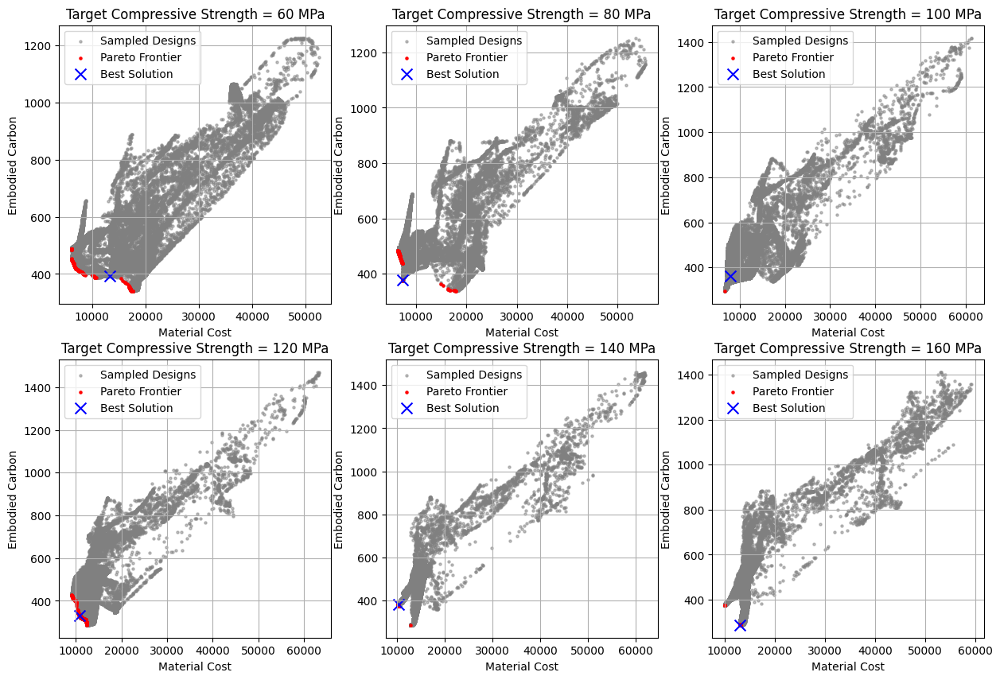

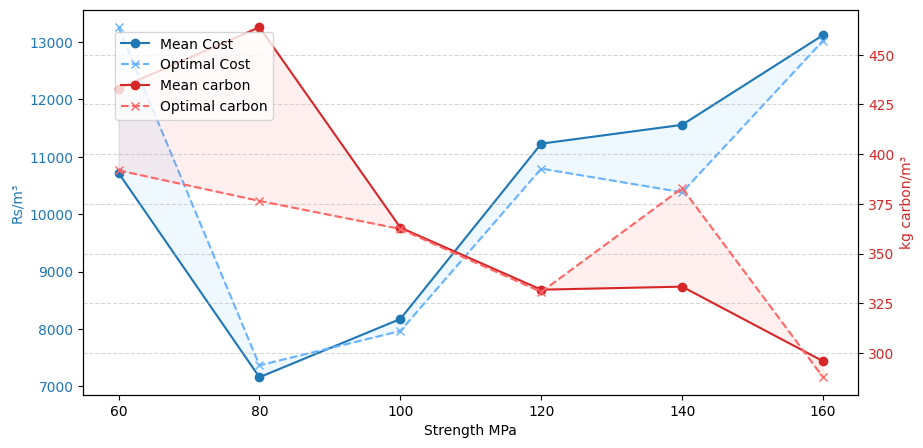

c1= 0.01 c2= 1

Best Solution 60 MPa:
 Cement (kg/m³)  SF (kg/m³)  BFS (kg/m³)  FA (kg/m³)  QP (kg/m³)  LSP (kg/m³)  NS (kg/m³)  Fiber (kg/m³)  Sand (kg/m³)  Gravel (kg/m³)  Water (kg/m³)  SP (kg/m³)    T (°C)  RH (%)  Age (days)  Strength (MPa)  Material Cost (Rs.)  Carbon (kg CO2/kg)
     475.936768    2.533836          0.0  355.911163         0.0 9.105765e-18    0.331761            0.0     747.63916        0.000658      161.43956   16.342701 20.162231   100.0    1.046526       62.988375          9122.619317          423.573262

Best Solution 80 MPa:
 Cement (kg/m³)  SF (kg/m³)  BFS (kg/m³)  FA (kg/m³)   QP (kg/m³)  LSP (kg/m³)   NS (kg/m³)  Fiber (kg/m³)  Sand (kg/m³)  Gravel (kg/m³)  Water (kg/m³)  SP (kg/m³)    T (°C)    RH (%)  Age (days)  Strength (MPa)  Material Cost (Rs.)  Carbon (kg CO2/kg)
      481.09079   17.157829    38.367165    0.494645 1.342106e-21     41.89315 1.748593e-17       0.000128    679.106262     1068.953613     139.793549    8.560637 23.983545 99.907257    9

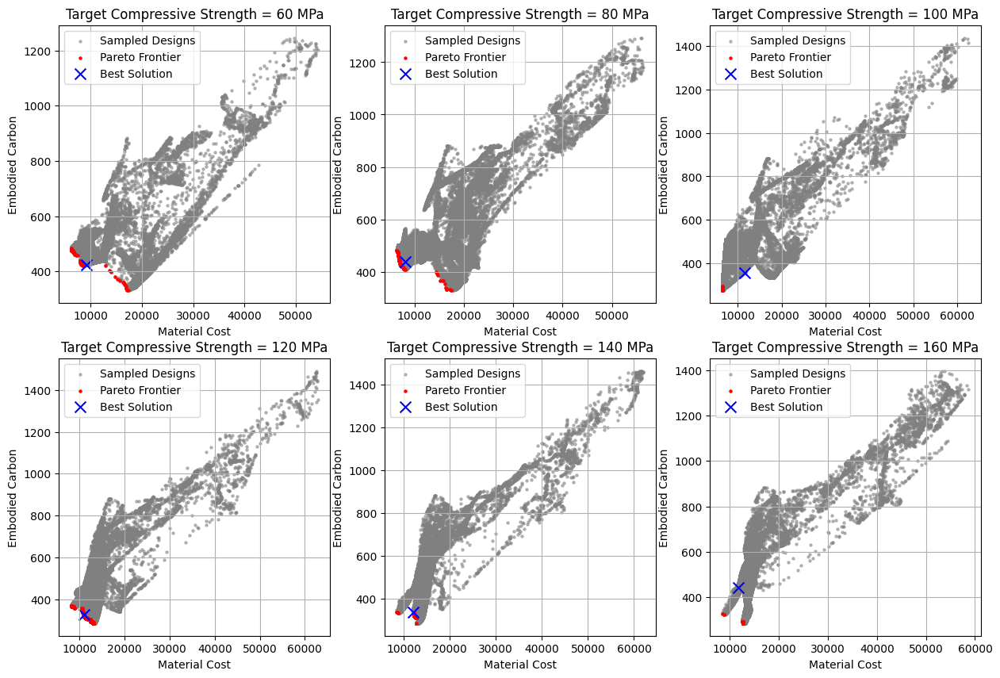

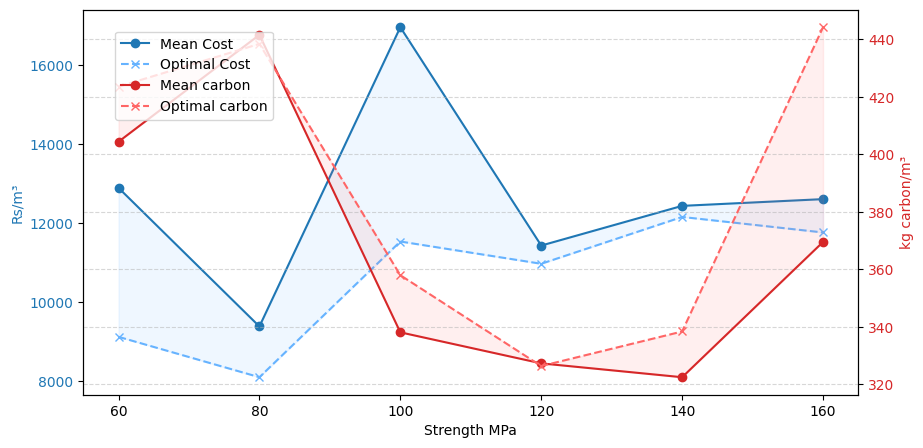

c1= 0.01 c2= 10

Best Solution 60 MPa:
 Cement (kg/m³)  SF (kg/m³)  BFS (kg/m³)  FA (kg/m³)  QP (kg/m³)  LSP (kg/m³)  NS (kg/m³)  Fiber (kg/m³)  Sand (kg/m³)  Gravel (kg/m³)  Water (kg/m³)  SP (kg/m³)    T (°C)  RH (%)  Age (days)  Strength (MPa)  Material Cost (Rs.)  Carbon (kg CO2/kg)
     493.102997    0.000965          0.0  355.993896         0.0     0.001682    1.390594            0.0    565.424255    9.248517e-14     160.385956   16.516375 21.000116   100.0    1.033249       61.483569          9133.462829          442.098966

Best Solution 80 MPa:
 Cement (kg/m³)  SF (kg/m³)  BFS (kg/m³)  FA (kg/m³)   QP (kg/m³)  LSP (kg/m³)   NS (kg/m³)  Fiber (kg/m³)  Sand (kg/m³)  Gravel (kg/m³)  Water (kg/m³)  SP (kg/m³)    T (°C)    RH (%)  Age (days)  Strength (MPa)  Material Cost (Rs.)  Carbon (kg CO2/kg)
     442.940857    5.853178    15.189282    0.000062 1.159518e-34     8.324388 1.111356e-15       0.000421    678.908936     1042.501587     141.536011   11.532537 24.328159 96.521996    

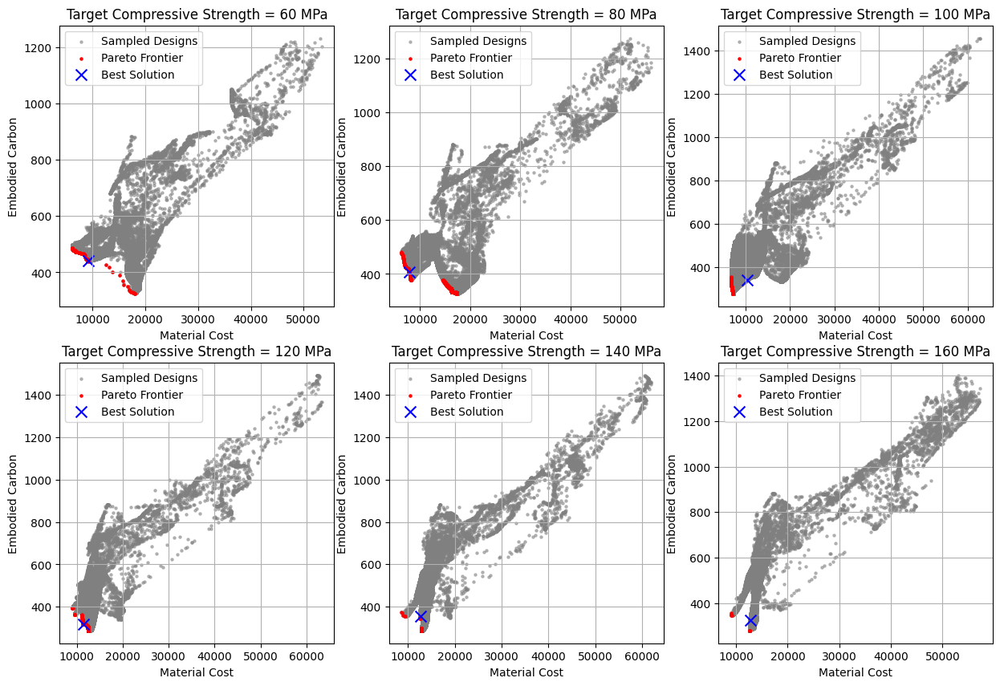

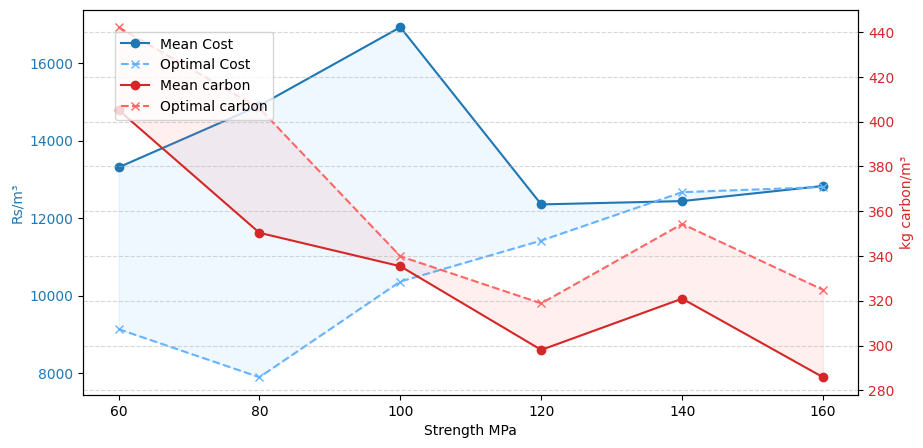

c1= 0.01 c2= 100

Best Solution 60 MPa:
 Cement (kg/m³)  SF (kg/m³)  BFS (kg/m³)  FA (kg/m³)  QP (kg/m³)  LSP (kg/m³)  NS (kg/m³)  Fiber (kg/m³)  Sand (kg/m³)  Gravel (kg/m³)  Water (kg/m³)  SP (kg/m³)    T (°C)  RH (%)  Age (days)  Strength (MPa)  Material Cost (Rs.)  Carbon (kg CO2/kg)
       457.7547     0.00006          0.0  355.999908         0.0 4.092017e-11    0.137465            0.0    841.710449    6.371907e-18     160.350174    18.62813 20.337582   100.0    1.134855       62.978745           9539.26217          410.059757

Best Solution 80 MPa:
 Cement (kg/m³)  SF (kg/m³)  BFS (kg/m³)  FA (kg/m³)   QP (kg/m³)  LSP (kg/m³)  NS (kg/m³)  Fiber (kg/m³)  Sand (kg/m³)  Gravel (kg/m³)  Water (kg/m³)  SP (kg/m³)    T (°C)    RH (%)  Age (days)  Strength (MPa)  Material Cost (Rs.)  Carbon (kg CO2/kg)
     475.055054    0.118661     0.013324    0.679436 5.661058e-25 5.364685e-07    0.001703       0.203361    735.345947     1024.416626     162.611969    9.736128 20.590111 99.998199    7

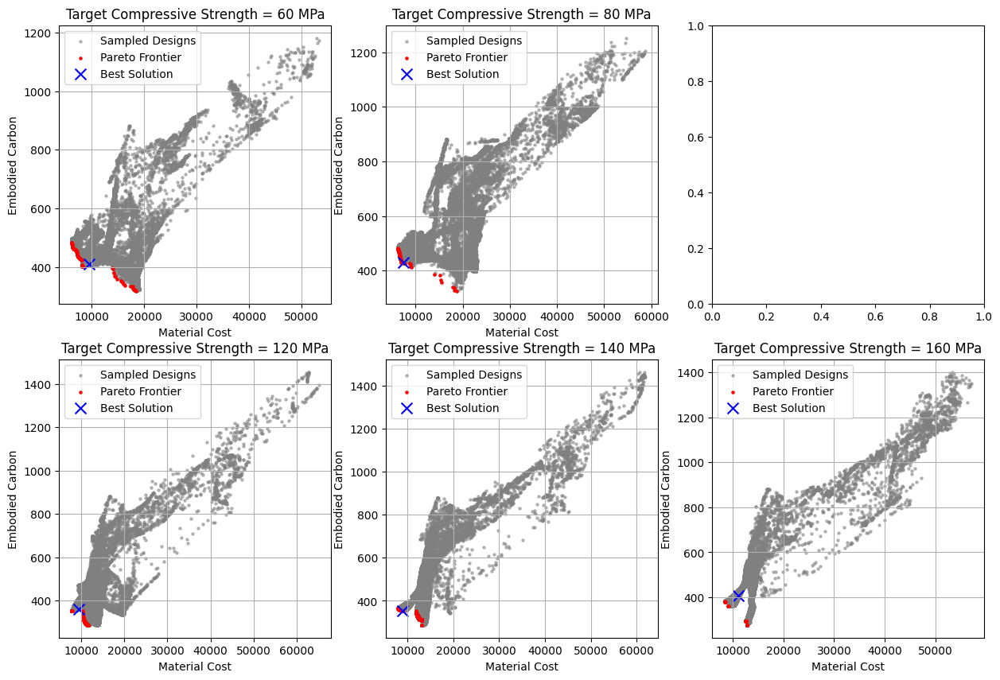

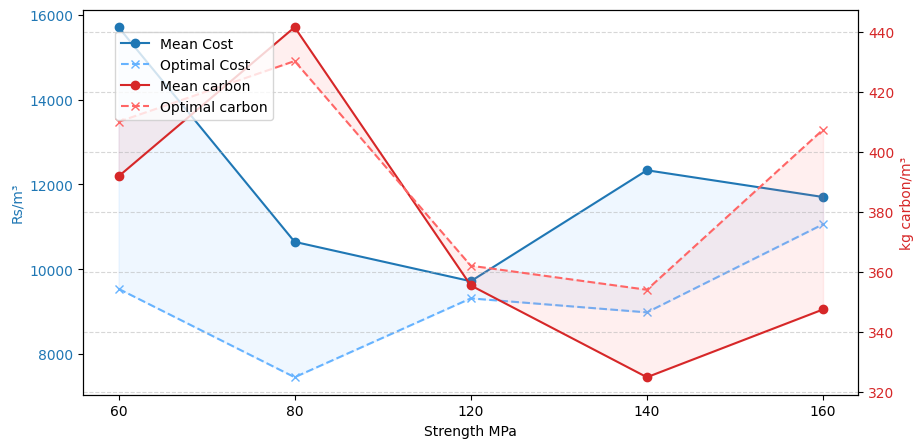

c1= 0.001 c2= 0.0001

Best Solution 60 MPa:
 Cement (kg/m³)  SF (kg/m³)  BFS (kg/m³)  FA (kg/m³)  QP (kg/m³)  LSP (kg/m³)  NS (kg/m³)  Fiber (kg/m³)  Sand (kg/m³)  Gravel (kg/m³)  Water (kg/m³)  SP (kg/m³)    T (°C)  RH (%)  Age (days)  Strength (MPa)  Material Cost (Rs.)  Carbon (kg CO2/kg)
     467.317444    0.001615          0.0  355.999756         0.0     0.001163    1.195659            0.0    567.327393    2.450923e-13     164.166763   16.527016 20.462196   100.0    1.081344       59.925898          8922.761877          419.488537

Best Solution 80 MPa:
 Cement (kg/m³)  SF (kg/m³)  BFS (kg/m³)  FA (kg/m³)   QP (kg/m³)  LSP (kg/m³)  NS (kg/m³)  Fiber (kg/m³)  Sand (kg/m³)  Gravel (kg/m³)  Water (kg/m³)  SP (kg/m³)    T (°C)    RH (%)  Age (days)  Strength (MPa)  Material Cost (Rs.)  Carbon (kg CO2/kg)
     472.714142      0.0935     0.000027    0.000947 1.233090e-28     0.000722    0.000775       0.105971    741.354797      1027.69751     163.516479    9.719132 20.983789 99.999352 

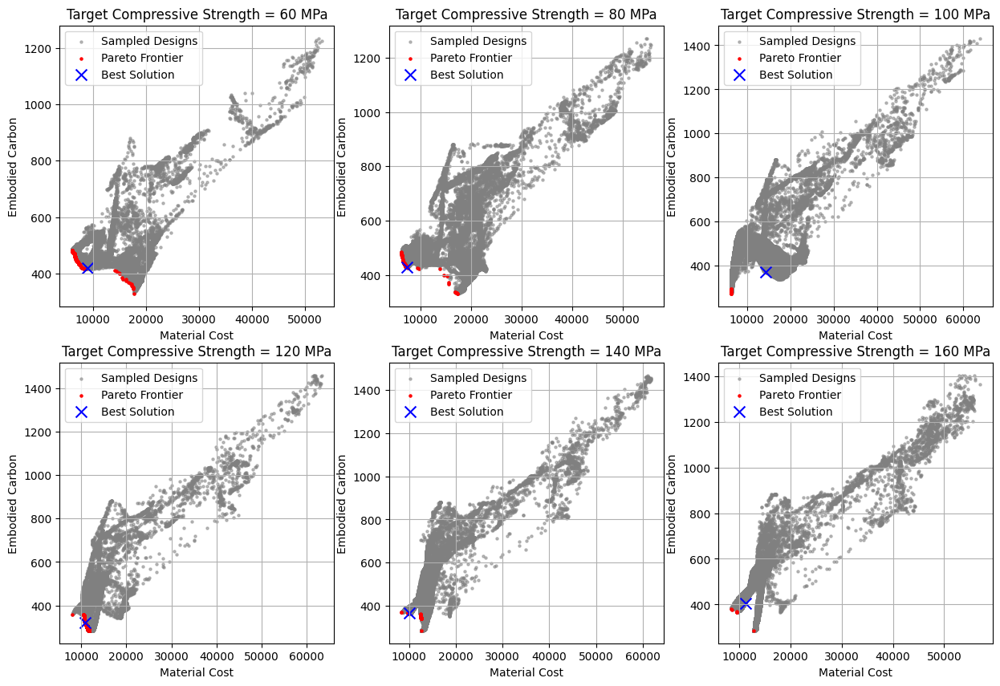

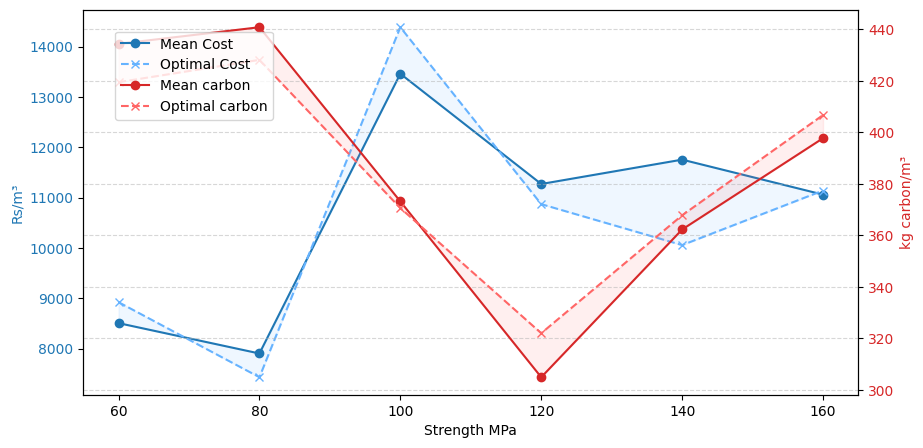

c1= 0.001 c2= 0.001

Best Solution 60 MPa:
 Cement (kg/m³)  SF (kg/m³)  BFS (kg/m³)  FA (kg/m³)  QP (kg/m³)  LSP (kg/m³)  NS (kg/m³)  Fiber (kg/m³)  Sand (kg/m³)  Gravel (kg/m³)  Water (kg/m³)  SP (kg/m³)    T (°C)  RH (%)  Age (days)  Strength (MPa)  Material Cost (Rs.)  Carbon (kg CO2/kg)
     433.216431    0.000588          0.0  355.979889         0.0     0.083733    0.863708            0.0    664.345703        0.165301     162.691925   13.598987 20.331614   100.0    1.104958       58.479509          8070.871823          387.114602

Best Solution 80 MPa:
 Cement (kg/m³)  SF (kg/m³)  BFS (kg/m³)  FA (kg/m³)  QP (kg/m³)  LSP (kg/m³)  NS (kg/m³)  Fiber (kg/m³)  Sand (kg/m³)  Gravel (kg/m³)  Water (kg/m³)  SP (kg/m³)    T (°C)    RH (%)  Age (days)  Strength (MPa)  Material Cost (Rs.)  Carbon (kg CO2/kg)
     462.411835    0.042466          0.0  355.787384         0.0 4.425117e-07    0.707147            0.0    885.537048        2.452854     162.073929   18.372677 20.408581 99.999992    

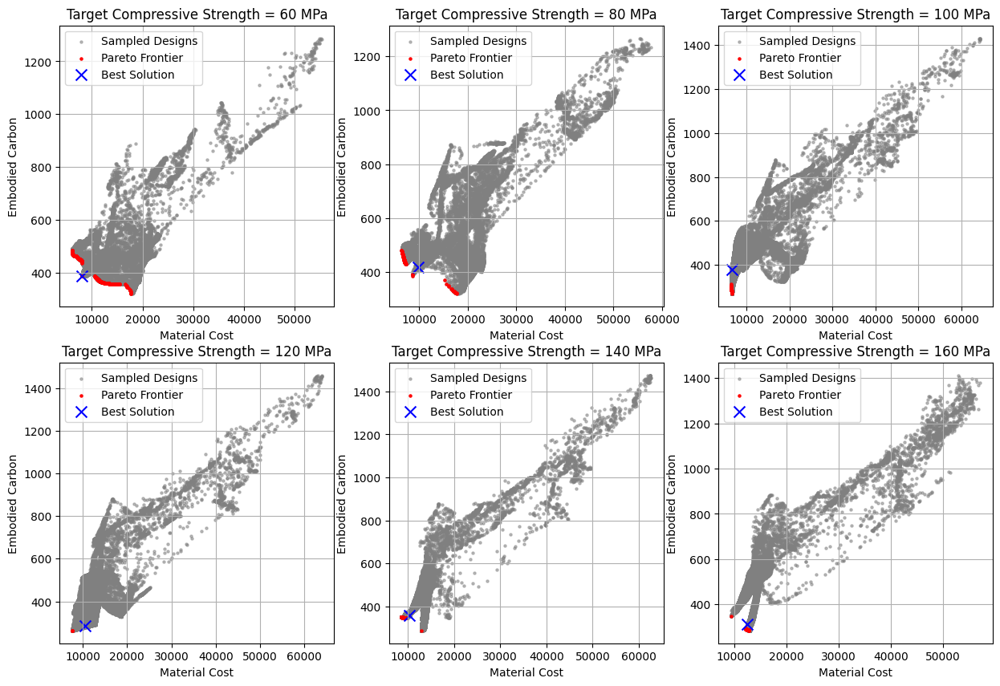

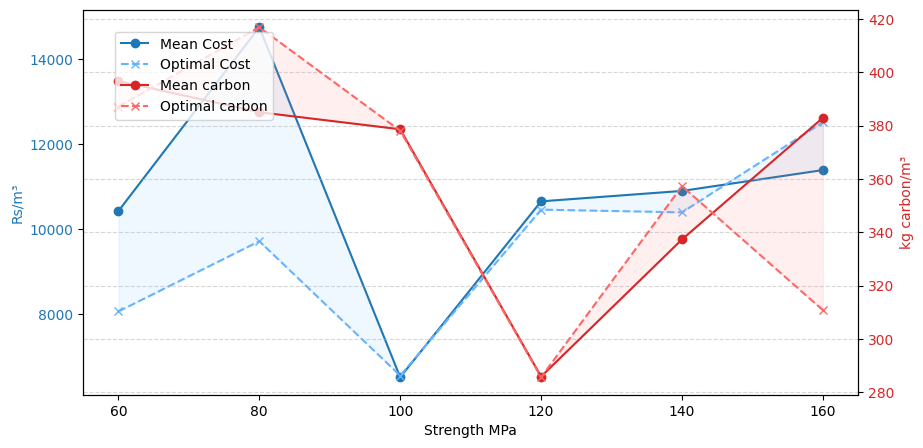

c1= 0.001 c2= 0.01

Best Solution 60 MPa:
 Cement (kg/m³)  SF (kg/m³)  BFS (kg/m³)  FA (kg/m³)  QP (kg/m³)  LSP (kg/m³)  NS (kg/m³)  Fiber (kg/m³)  Sand (kg/m³)  Gravel (kg/m³)  Water (kg/m³)  SP (kg/m³)    T (°C)  RH (%)  Age (days)  Strength (MPa)  Material Cost (Rs.)  Carbon (kg CO2/kg)
     435.210175    0.000101          0.0   180.34314         0.0 1.276686e-11    0.770045            0.0    549.760315       35.747871     157.743484   12.630432 20.063335   100.0    1.064184       60.644878           7321.58674          386.472589

Best Solution 80 MPa:
 Cement (kg/m³)  SF (kg/m³)  BFS (kg/m³)  FA (kg/m³)  QP (kg/m³)  LSP (kg/m³)  NS (kg/m³)  Fiber (kg/m³)  Sand (kg/m³)  Gravel (kg/m³)  Water (kg/m³)  SP (kg/m³)    T (°C)  RH (%)  Age (days)  Strength (MPa)  Material Cost (Rs.)  Carbon (kg CO2/kg)
     480.622742    0.041465          0.0  234.791321         0.0 1.656976e-16    0.322496            0.0     852.87384       81.351814     161.439529     18.7061 20.171844   100.0    5.002

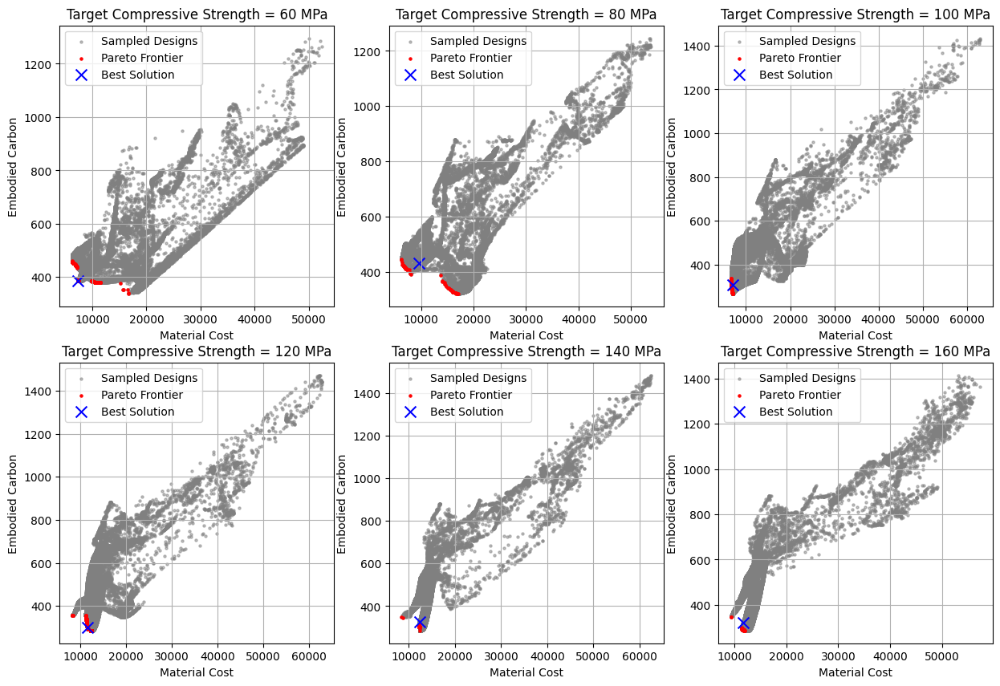

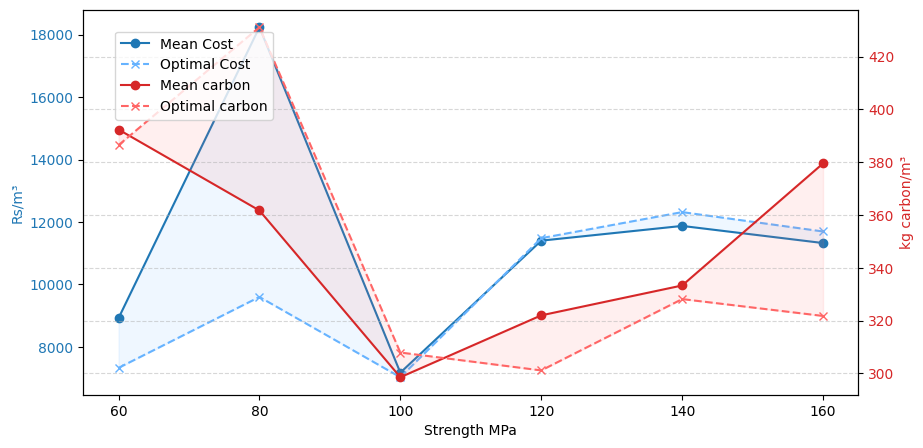

c1= 0.001 c2= 0.1

Best Solution 60 MPa:
 Cement (kg/m³)  SF (kg/m³)  BFS (kg/m³)  FA (kg/m³)  QP (kg/m³)  LSP (kg/m³)  NS (kg/m³)  Fiber (kg/m³)  Sand (kg/m³)  Gravel (kg/m³)  Water (kg/m³)  SP (kg/m³)    T (°C)  RH (%)  Age (days)  Strength (MPa)  Material Cost (Rs.)  Carbon (kg CO2/kg)
     469.331024    0.000004          0.0  355.998779         0.0 1.310310e-17     0.13506            0.0    719.416382    9.052348e-11        165.084   13.076573 20.294987   100.0    1.057387       59.584969          8085.858125          413.698264

Best Solution 80 MPa:
 Cement (kg/m³)  SF (kg/m³)  BFS (kg/m³)  FA (kg/m³)   QP (kg/m³)  LSP (kg/m³)  NS (kg/m³)  Fiber (kg/m³)  Sand (kg/m³)  Gravel (kg/m³)  Water (kg/m³)  SP (kg/m³)    T (°C)    RH (%)  Age (days)  Strength (MPa)  Material Cost (Rs.)  Carbon (kg CO2/kg)
      495.32843    0.075677 4.509376e-12   11.561291 2.992969e-26     0.000815    0.000045       1.351382    706.781677     1023.075684     162.597382   10.054452 20.520168 99.999031   6

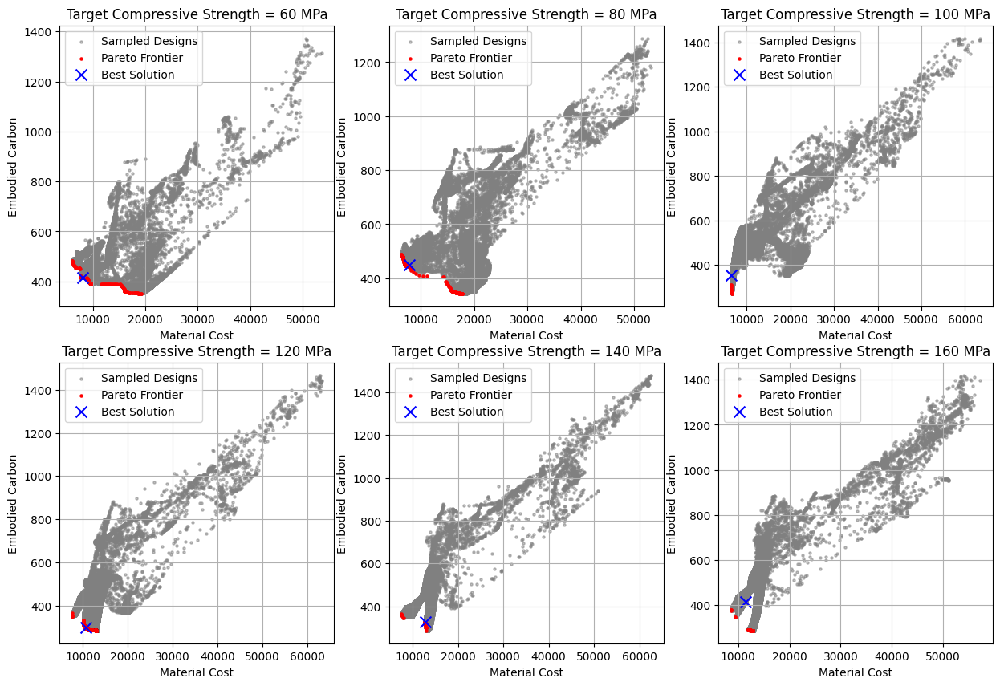

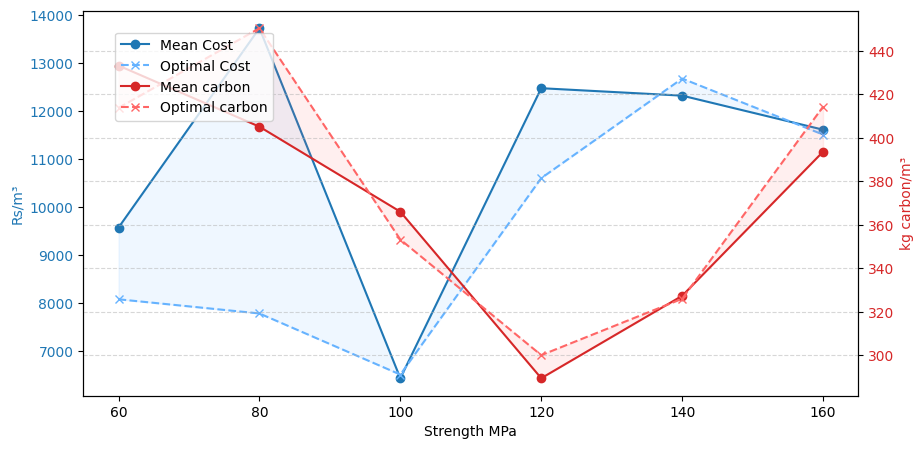

c1= 0.001 c2= 1

Best Solution 60 MPa:
 Cement (kg/m³)   SF (kg/m³)  BFS (kg/m³)  FA (kg/m³)  QP (kg/m³)  LSP (kg/m³)  NS (kg/m³)  Fiber (kg/m³)  Sand (kg/m³)  Gravel (kg/m³)  Water (kg/m³)  SP (kg/m³)  T (°C)  RH (%)  Age (days)  Strength (MPa)  Material Cost (Rs.)  Carbon (kg CO2/kg)
     474.474091 1.644606e-08          0.0       356.0         0.0 5.699639e-31    0.025939            0.0    845.230042    1.181689e-15     163.993683   14.567543 20.2047   100.0    1.116598       58.395622            8651.1447           419.75483

Best Solution 80 MPa:
 Cement (kg/m³)  SF (kg/m³)  BFS (kg/m³)  FA (kg/m³)   QP (kg/m³)  LSP (kg/m³)  NS (kg/m³)  Fiber (kg/m³)  Sand (kg/m³)  Gravel (kg/m³)  Water (kg/m³)  SP (kg/m³)    T (°C)    RH (%)  Age (days)  Strength (MPa)  Material Cost (Rs.)  Carbon (kg CO2/kg)
     491.272919    0.544779 9.358992e-12   12.112062 1.219630e-29     0.022437    0.000207       0.422454    692.583069     1026.556274     162.639343    9.497859 20.575354 99.993584   56.08

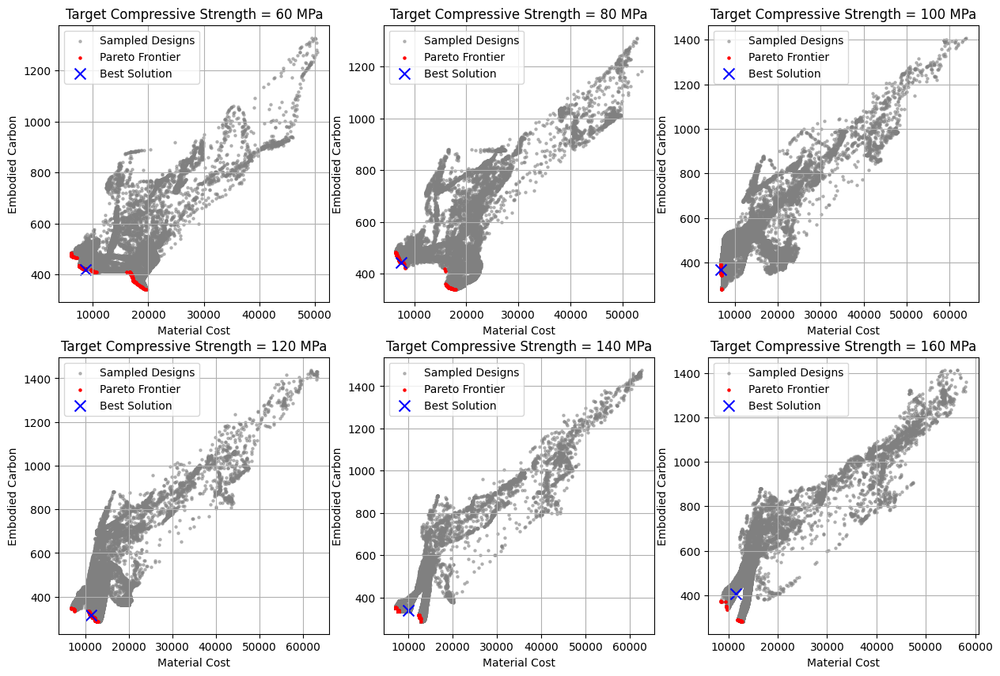

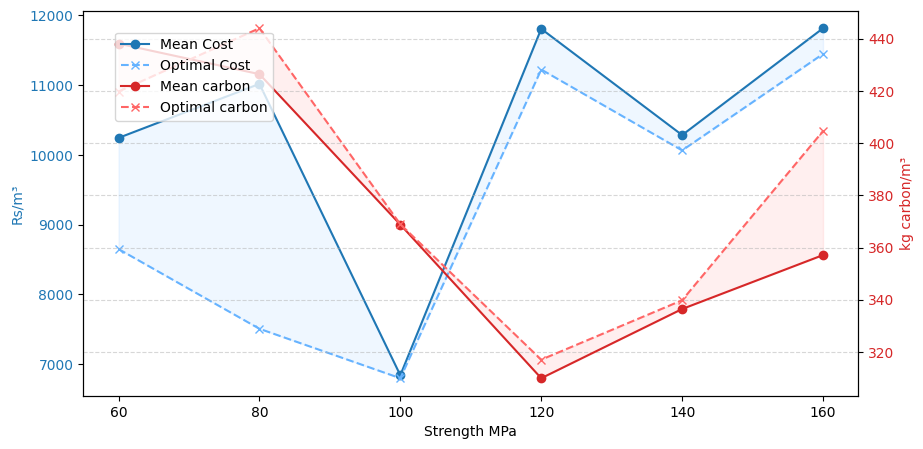

c1= 0.001 c2= 10

Best Solution 60 MPa:
 Cement (kg/m³)   SF (kg/m³)  BFS (kg/m³)   FA (kg/m³)  QP (kg/m³)  LSP (kg/m³)  NS (kg/m³)  Fiber (kg/m³)  Sand (kg/m³)  Gravel (kg/m³)  Water (kg/m³)  SP (kg/m³)    T (°C)  RH (%)  Age (days)  Strength (MPa)  Material Cost (Rs.)  Carbon (kg CO2/kg)
      463.38031 3.120525e-13          0.0 8.062496e-21         0.0 3.993778e-20    3.861147            0.0    673.559937     1118.060303     137.874298    12.00281 20.487364   100.0    1.000473       60.153497          8830.077233          442.459296

Best Solution 80 MPa:
 Cement (kg/m³)  SF (kg/m³)  BFS (kg/m³)  FA (kg/m³)  QP (kg/m³)  LSP (kg/m³)   NS (kg/m³)  Fiber (kg/m³)  Sand (kg/m³)  Gravel (kg/m³)  Water (kg/m³)  SP (kg/m³)    T (°C)  RH (%)  Age (days)  Strength (MPa)  Material Cost (Rs.)  Carbon (kg CO2/kg)
     433.782532   16.589861    57.350239  181.988556         0.0 1.861278e-10 2.419848e-07       0.000005   1006.202881        0.104911     166.555542   25.293901 20.171219   100.0   10

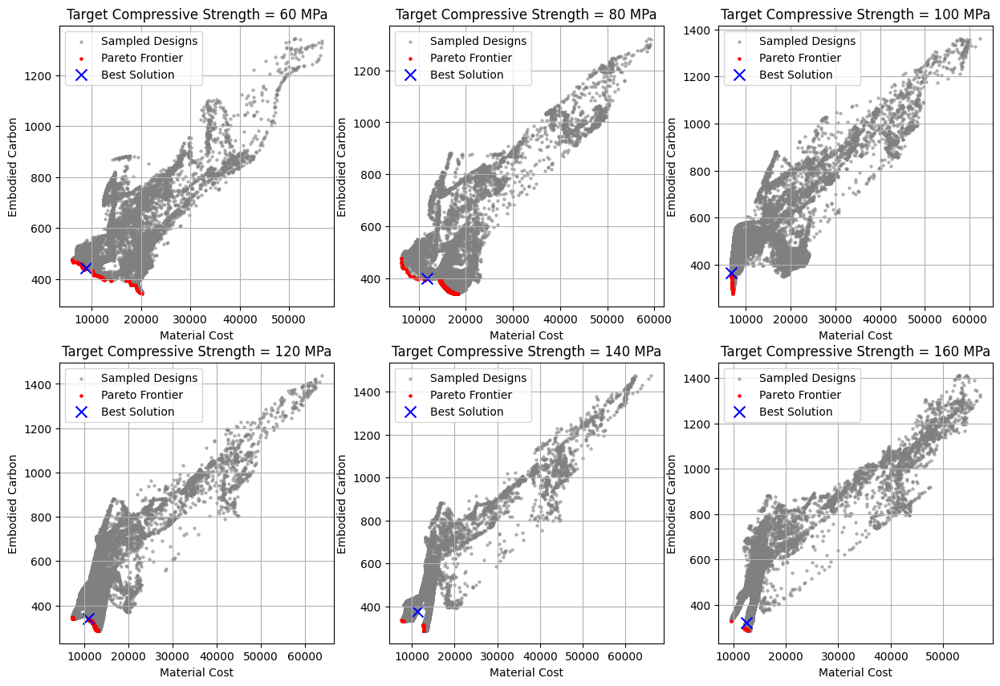

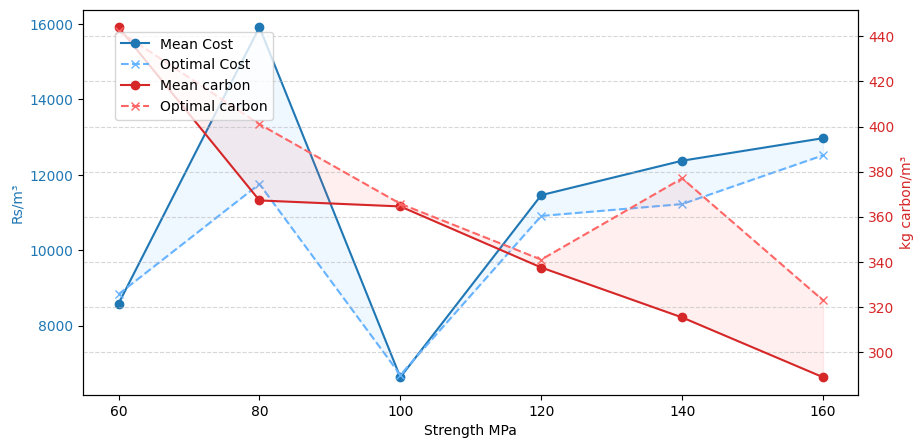

c1= 0.001 c2= 100

Best Solution 60 MPa:
 Cement (kg/m³)   SF (kg/m³)  BFS (kg/m³)   FA (kg/m³)  QP (kg/m³)  LSP (kg/m³)  NS (kg/m³)  Fiber (kg/m³)  Sand (kg/m³)  Gravel (kg/m³)  Water (kg/m³)  SP (kg/m³)    T (°C)  RH (%)  Age (days)  Strength (MPa)  Material Cost (Rs.)  Carbon (kg CO2/kg)
     472.198303 5.271818e-09 3.630116e-31 3.917988e-09         0.0 1.363029e-14    1.647995            0.0    659.727661     1091.373291     145.779785   11.996954 20.115063   100.0    1.004096       59.504396          8289.219473          438.272907

Best Solution 80 MPa:
 Cement (kg/m³)  SF (kg/m³)  BFS (kg/m³)  FA (kg/m³)  QP (kg/m³)  LSP (kg/m³)  NS (kg/m³)  Fiber (kg/m³)  Sand (kg/m³)  Gravel (kg/m³)  Water (kg/m³)  SP (kg/m³)    T (°C)  RH (%)  Age (days)  Strength (MPa)  Material Cost (Rs.)  Carbon (kg CO2/kg)
     344.812744  109.155991        375.0   174.30014         0.0 4.374715e-25    0.000008        0.00019    848.342651             0.0     178.470398   25.250624 20.020977   100.0    6.

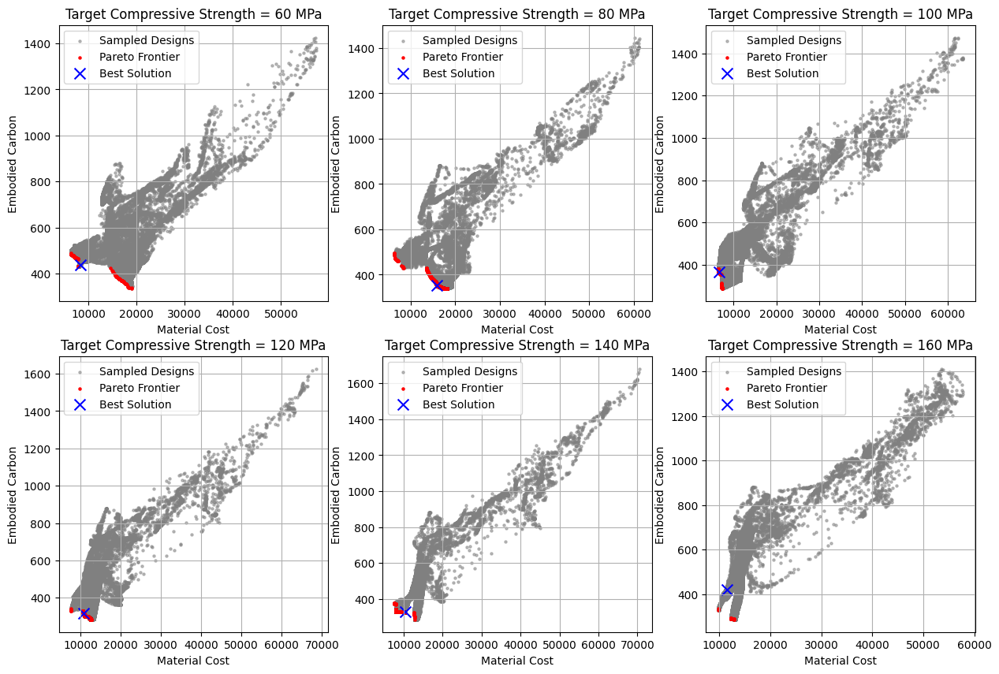

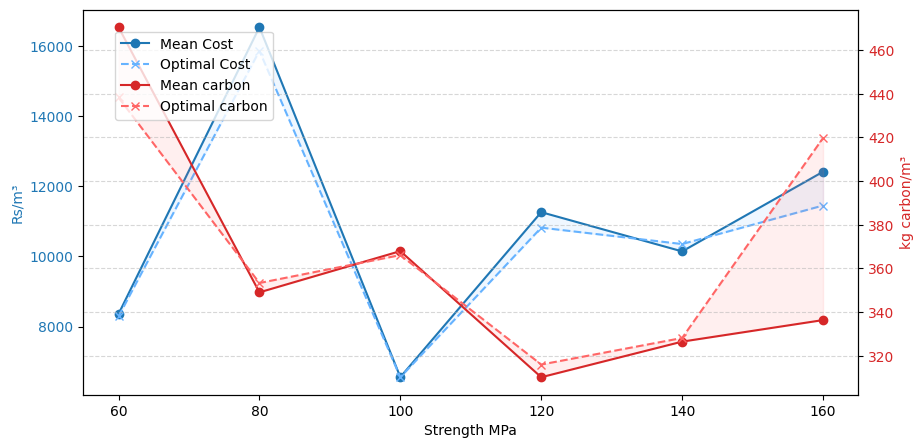

c1= 0.0001 c2= 0.0001

Best Solution 60 MPa:
 Cement (kg/m³)  SF (kg/m³)  BFS (kg/m³)  FA (kg/m³)  QP (kg/m³)  LSP (kg/m³)  NS (kg/m³)  Fiber (kg/m³)  Sand (kg/m³)  Gravel (kg/m³)  Water (kg/m³)  SP (kg/m³)    T (°C)  RH (%)  Age (days)  Strength (MPa)  Material Cost (Rs.)  Carbon (kg CO2/kg)
     440.781006    0.430449    24.238424  139.269104         0.0 2.623554e-12    0.002213        0.00006    896.809021        2.742417     163.271088   19.833227 20.608656   100.0    4.962786       57.760884          9416.658779          397.773751

Best Solution 80 MPa:
 Cement (kg/m³)  SF (kg/m³)  BFS (kg/m³)  FA (kg/m³)  QP (kg/m³)  LSP (kg/m³)  NS (kg/m³)  Fiber (kg/m³)  Sand (kg/m³)  Gravel (kg/m³)  Water (kg/m³)  SP (kg/m³)    T (°C)  RH (%)  Age (days)  Strength (MPa)  Material Cost (Rs.)  Carbon (kg CO2/kg)
     513.693604    0.000011          0.0  145.472778         0.0 1.298210e-18    0.051039            0.0    789.813904      190.419357      153.24649    18.23317 20.306395   100.0    5.

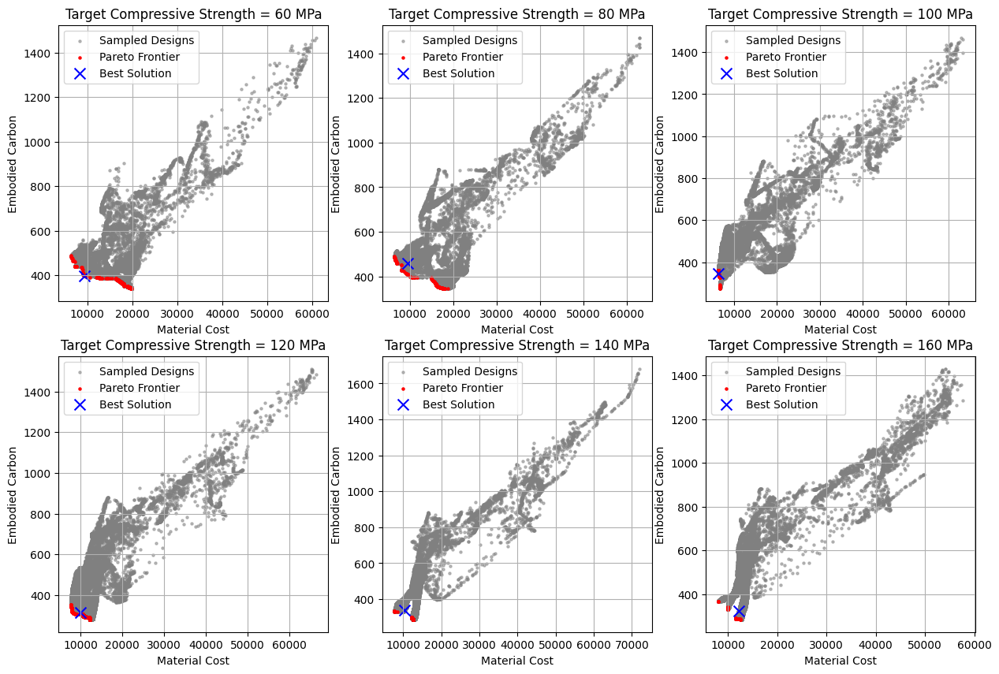

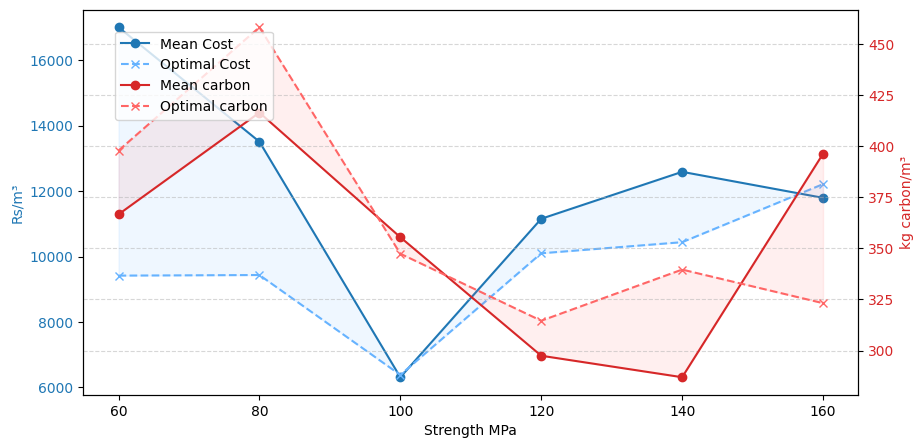

c1= 0.0001 c2= 0.001

Best Solution 60 MPa:
 Cement (kg/m³)   SF (kg/m³)  BFS (kg/m³)  FA (kg/m³)  QP (kg/m³)  LSP (kg/m³)  NS (kg/m³)  Fiber (kg/m³)  Sand (kg/m³)  Gravel (kg/m³)  Water (kg/m³)  SP (kg/m³)    T (°C)    RH (%)  Age (days)  Strength (MPa)  Material Cost (Rs.)  Carbon (kg CO2/kg)
     484.940643 3.502582e-10          0.0       356.0         0.0 4.617812e-35    0.000003            0.0     716.98584        0.000001     170.437943   14.455635 20.492767 99.999893    1.671071       58.824492          8480.644778          427.415443

Best Solution 80 MPa:
 Cement (kg/m³)  SF (kg/m³)  BFS (kg/m³)   FA (kg/m³)  QP (kg/m³)  LSP (kg/m³)  NS (kg/m³)  Fiber (kg/m³)  Sand (kg/m³)  Gravel (kg/m³)  Water (kg/m³)  SP (kg/m³)    T (°C)  RH (%)  Age (days)  Strength (MPa)  Material Cost (Rs.)  Carbon (kg CO2/kg)
     452.897888    9.989621    69.877533 7.804933e-14         0.0 1.490131e-19    0.007741       0.000149    846.735046      458.379822     162.417542   16.276196 20.143919   100.

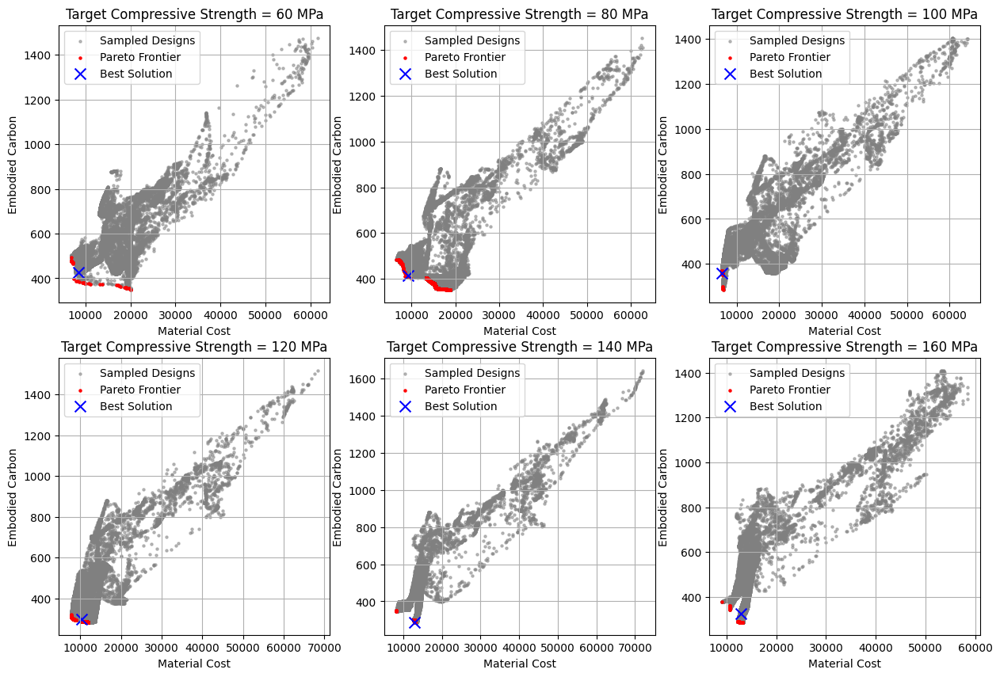

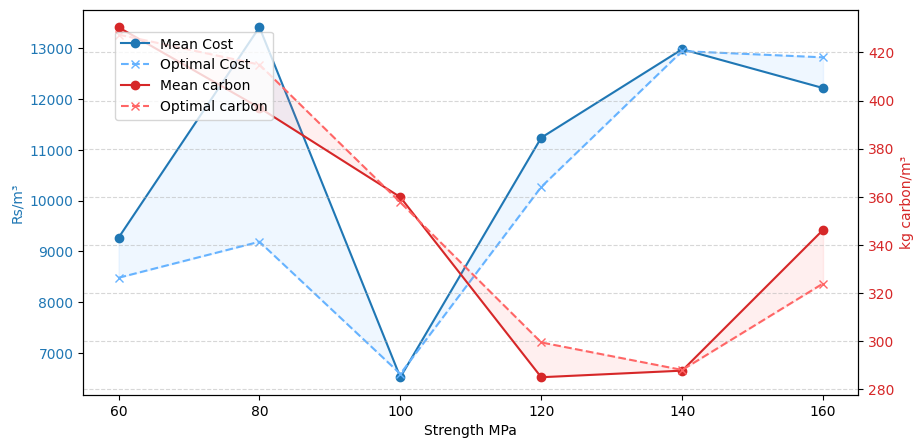

c1= 0.0001 c2= 0.01

Best Solution 60 MPa:
 Cement (kg/m³)  SF (kg/m³)  BFS (kg/m³)  FA (kg/m³)  QP (kg/m³)  LSP (kg/m³)  NS (kg/m³)  Fiber (kg/m³)  Sand (kg/m³)  Gravel (kg/m³)  Water (kg/m³)  SP (kg/m³)    T (°C)  RH (%)  Age (days)  Strength (MPa)  Material Cost (Rs.)  Carbon (kg CO2/kg)
     509.583008   18.753267     9.286558  160.192352         0.0          0.0     0.07557       0.001006    945.423096      386.811646     174.638702   13.268546 20.122046   100.0     4.89201       59.041793          9536.663226          455.690691

Best Solution 80 MPa:
 Cement (kg/m³)  SF (kg/m³)  BFS (kg/m³)  FA (kg/m³)  QP (kg/m³)  LSP (kg/m³)  NS (kg/m³)  Fiber (kg/m³)  Sand (kg/m³)  Gravel (kg/m³)  Water (kg/m³)  SP (kg/m³)    T (°C)  RH (%)  Age (days)  Strength (MPa)  Material Cost (Rs.)  Carbon (kg CO2/kg)
      452.45462    4.010323     3.586751    5.197803         0.0 1.372617e-24     0.00389       0.000071     859.92627      242.392487       170.5345   20.420719 20.077581   100.0   18.90

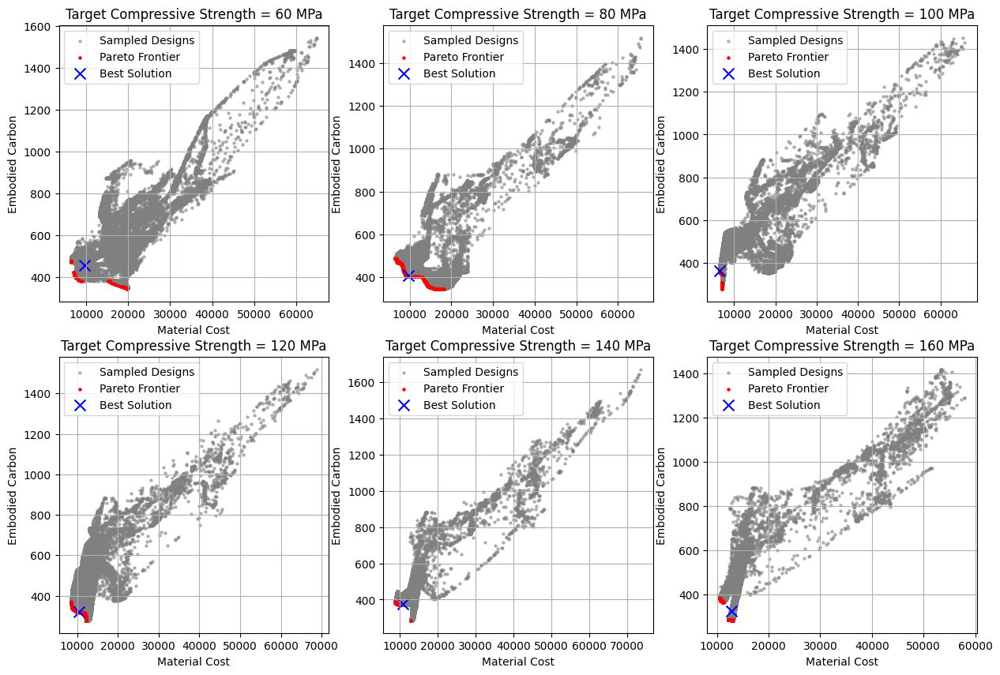

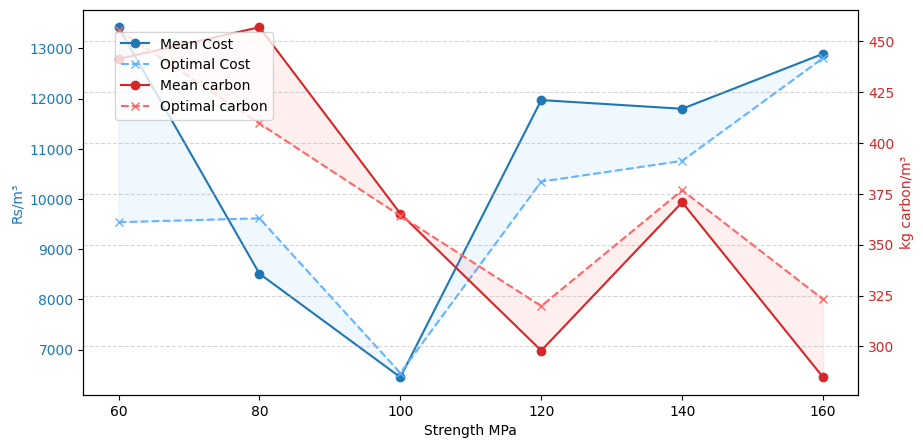

c1= 0.0001 c2= 0.1

Best Solution 60 MPa:
 Cement (kg/m³)  SF (kg/m³)  BFS (kg/m³)  FA (kg/m³)   QP (kg/m³)  LSP (kg/m³)  NS (kg/m³)  Fiber (kg/m³)  Sand (kg/m³)  Gravel (kg/m³)  Water (kg/m³)  SP (kg/m³)    T (°C)  RH (%)  Age (days)  Strength (MPa)  Material Cost (Rs.)  Carbon (kg CO2/kg)
     467.934113    21.16872      5.49031    0.001661 2.481711e-35 8.379677e-16    0.028769       0.010501    922.592224      606.598083     167.049026   13.290707 20.144995   100.0    4.981306       60.760266          9181.418697          422.999432

Best Solution 80 MPa:
 Cement (kg/m³)   SF (kg/m³)  BFS (kg/m³)  FA (kg/m³)  QP (kg/m³)  LSP (kg/m³)  NS (kg/m³)  Fiber (kg/m³)  Sand (kg/m³)  Gravel (kg/m³)  Water (kg/m³)  SP (kg/m³)    T (°C)  RH (%)  Age (days)  Strength (MPa)  Material Cost (Rs.)  Carbon (kg CO2/kg)
     453.818939 2.392848e-10          0.0       356.0         0.0 5.569111e-25    0.000005            0.0    686.967773    7.430139e-23     149.752823   15.278769 20.811607   100.0    8

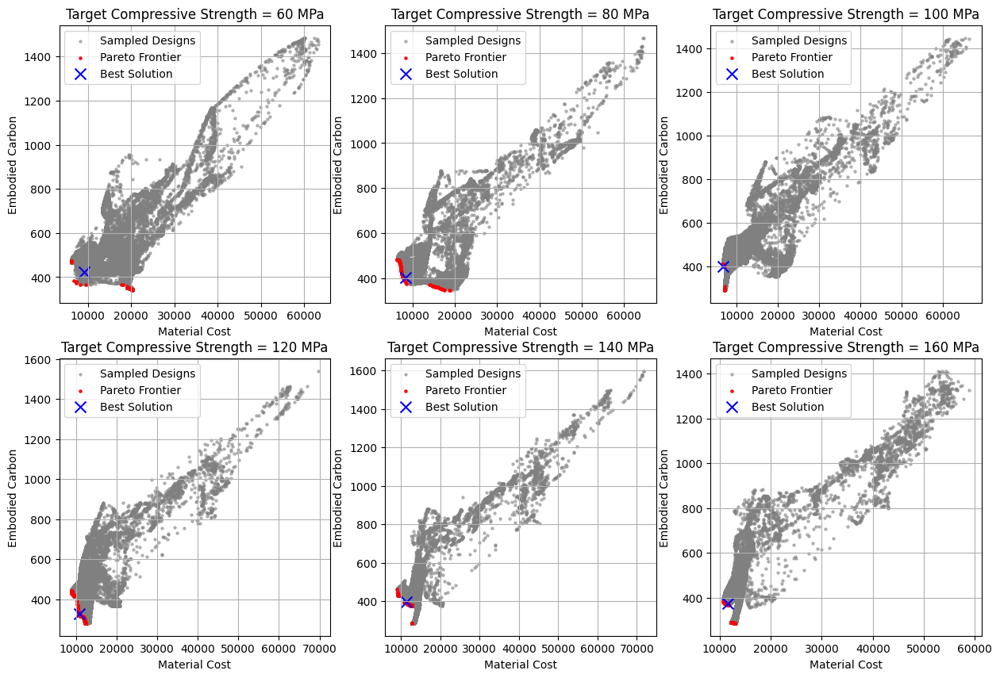

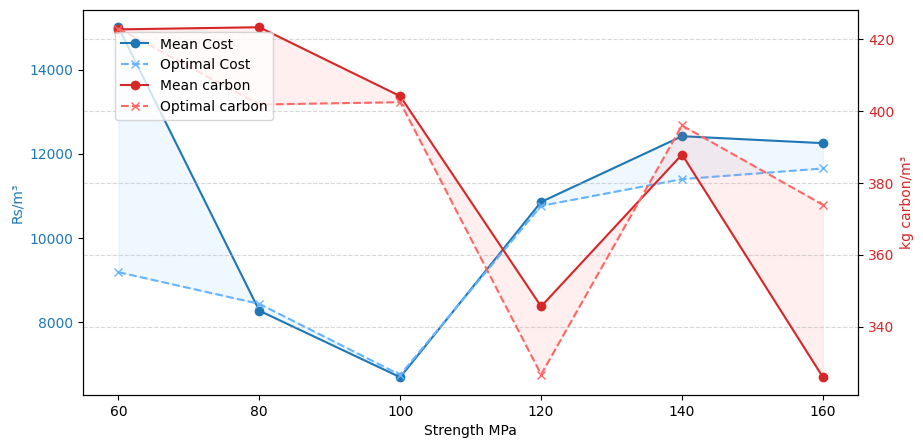

c1= 0.0001 c2= 1

Best Solution 60 MPa:
 Cement (kg/m³)  SF (kg/m³)  BFS (kg/m³)  FA (kg/m³)  QP (kg/m³)  LSP (kg/m³)  NS (kg/m³)  Fiber (kg/m³)  Sand (kg/m³)  Gravel (kg/m³)  Water (kg/m³)  SP (kg/m³)    T (°C)  RH (%)  Age (days)  Strength (MPa)  Material Cost (Rs.)  Carbon (kg CO2/kg)
     397.191101    0.059644     2.998075    0.095226         0.0 3.443277e-32    0.000006       0.000002    824.815918        0.015823     153.072571   12.354568 20.371441   100.0    3.974139       62.686168           6876.37021          351.300449

Best Solution 80 MPa:
 Cement (kg/m³)  SF (kg/m³)  BFS (kg/m³)  FA (kg/m³)  QP (kg/m³)  LSP (kg/m³)  NS (kg/m³)  Fiber (kg/m³)  Sand (kg/m³)  Gravel (kg/m³)  Water (kg/m³)  SP (kg/m³)    T (°C)  RH (%)  Age (days)  Strength (MPa)  Material Cost (Rs.)  Carbon (kg CO2/kg)
        393.819   30.301168   167.076172  123.877586         0.0 2.085568e-27    0.000193       0.001195    857.276062       60.986469     160.889267   15.207017 20.082756   100.0   10.40595

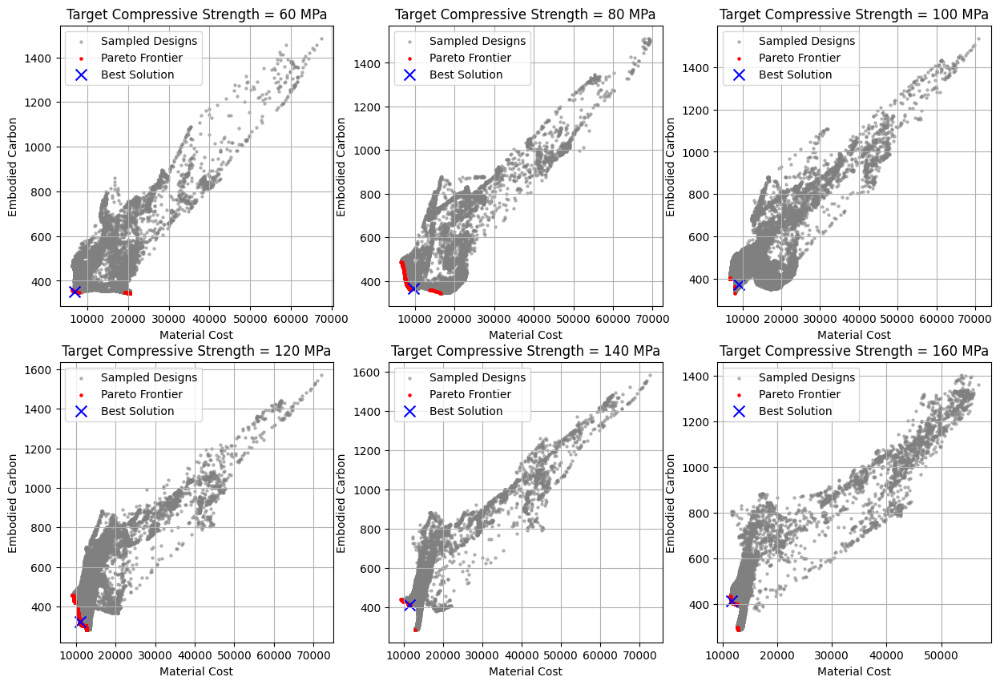

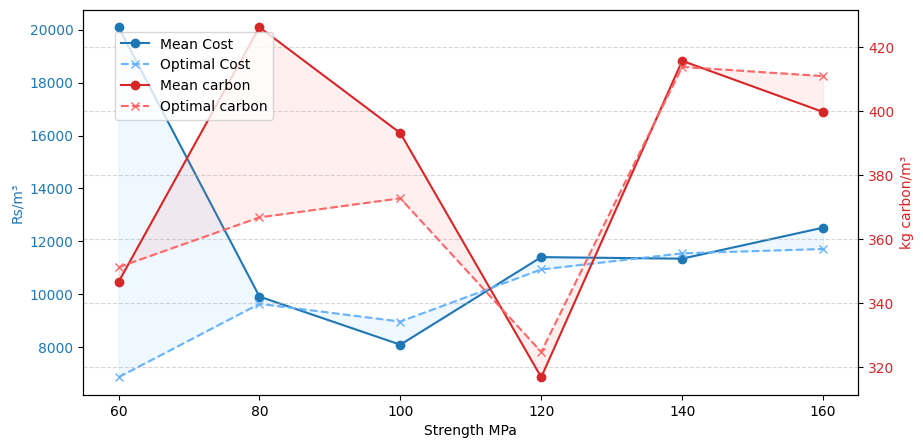

c1= 0.0001 c2= 10

Best Solution 60 MPa:
 Cement (kg/m³)  SF (kg/m³)  BFS (kg/m³)  FA (kg/m³)   QP (kg/m³)  LSP (kg/m³)  NS (kg/m³)  Fiber (kg/m³)  Sand (kg/m³)  Gravel (kg/m³)  Water (kg/m³)  SP (kg/m³)    T (°C)  RH (%)  Age (days)  Strength (MPa)  Material Cost (Rs.)  Carbon (kg CO2/kg)
     457.594421    1.842005     0.109266    0.000931 1.513734e-33 5.275723e-19    0.001999       0.005577    853.618652      693.538086     147.233521   10.922145 20.503057   100.0    4.018187       62.718783          7601.984338           411.83546

Best Solution 80 MPa:
 Cement (kg/m³)   SF (kg/m³)  BFS (kg/m³)  FA (kg/m³)  QP (kg/m³)  LSP (kg/m³)   NS (kg/m³)  Fiber (kg/m³)  Sand (kg/m³)  Gravel (kg/m³)  Water (kg/m³)  SP (kg/m³)    T (°C)  RH (%)  Age (days)  Strength (MPa)  Material Cost (Rs.)  Carbon (kg CO2/kg)
     471.500458 1.524889e-12          0.0       356.0         0.0          0.0 2.533485e-11            0.0    562.040161    1.990296e-24     156.618011   17.985512 20.581381   100.0    

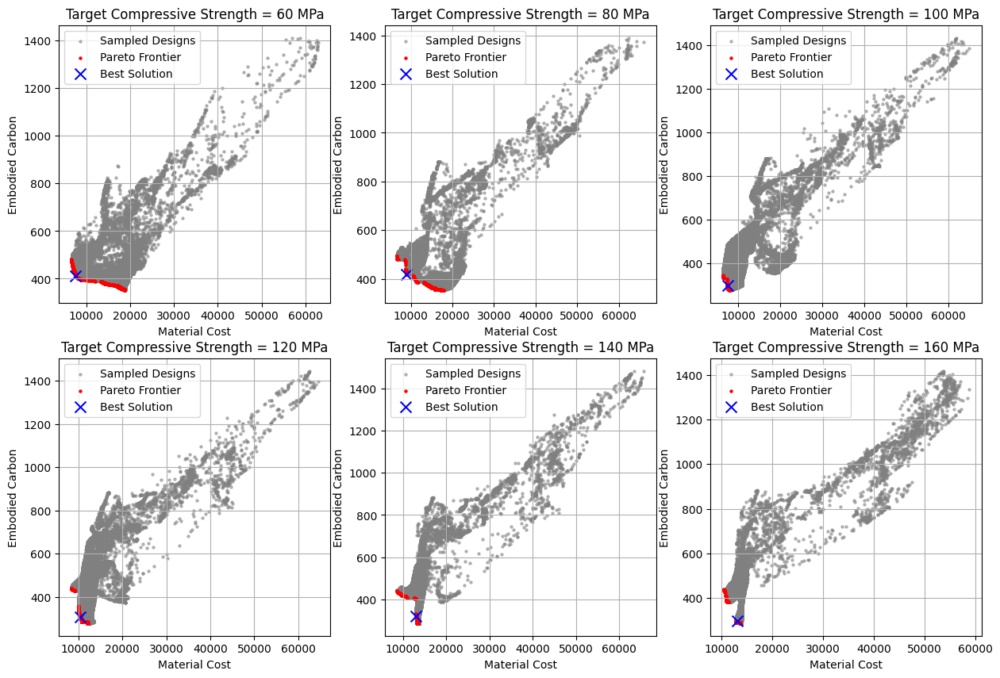

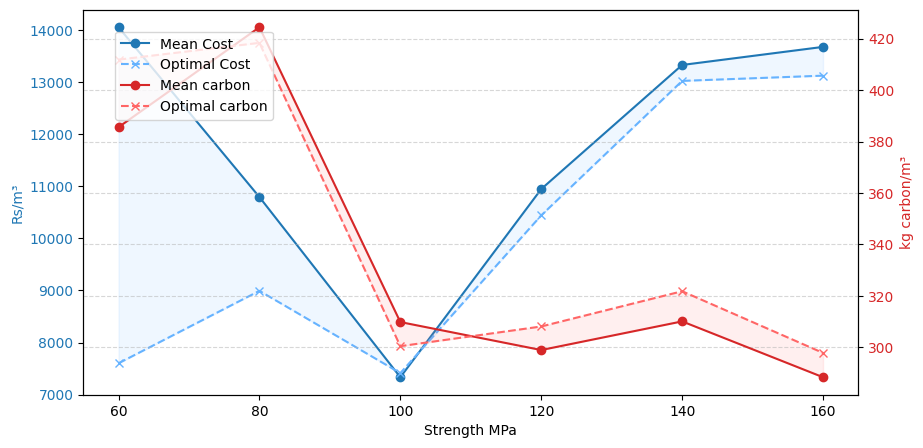

c1= 0.0001 c2= 100

Best Solution 60 MPa:
 Cement (kg/m³)   SF (kg/m³)  BFS (kg/m³)  FA (kg/m³)  QP (kg/m³)  LSP (kg/m³)   NS (kg/m³)  Fiber (kg/m³)  Sand (kg/m³)  Gravel (kg/m³)  Water (kg/m³)  SP (kg/m³)    T (°C)  RH (%)  Age (days)  Strength (MPa)  Material Cost (Rs.)  Carbon (kg CO2/kg)
     468.996124 2.465659e-09          0.0       356.0         0.0          0.0 7.741152e-07            0.0    922.870972    5.409965e-14     162.518326   16.905138 20.221186   100.0    2.296088       61.172092           9294.30168          417.764178

Best Solution 80 MPa:
 Cement (kg/m³)  SF (kg/m³)  BFS (kg/m³)  FA (kg/m³)  QP (kg/m³)  LSP (kg/m³)  NS (kg/m³)  Fiber (kg/m³)  Sand (kg/m³)  Gravel (kg/m³)  Water (kg/m³)  SP (kg/m³)    T (°C)  RH (%)  Age (days)  Strength (MPa)  Material Cost (Rs.)  Carbon (kg CO2/kg)
      434.23822    0.028825    11.254556    0.002236         0.0 1.800457e-23    0.005168   1.386693e-08    813.026123         0.00001     152.182953   12.573834 20.257992   100.0    1

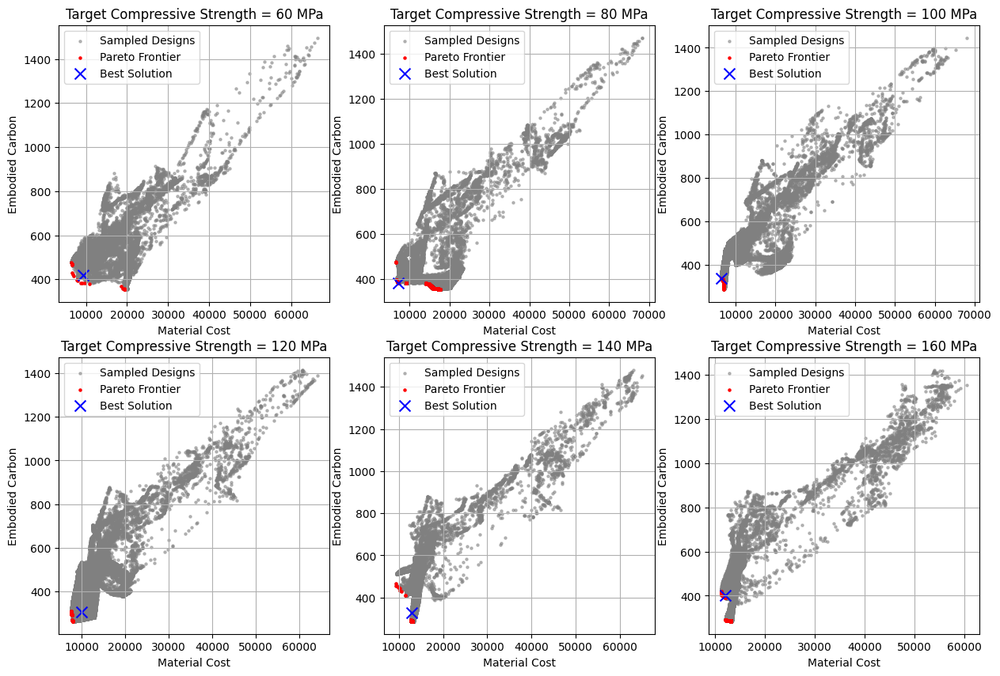

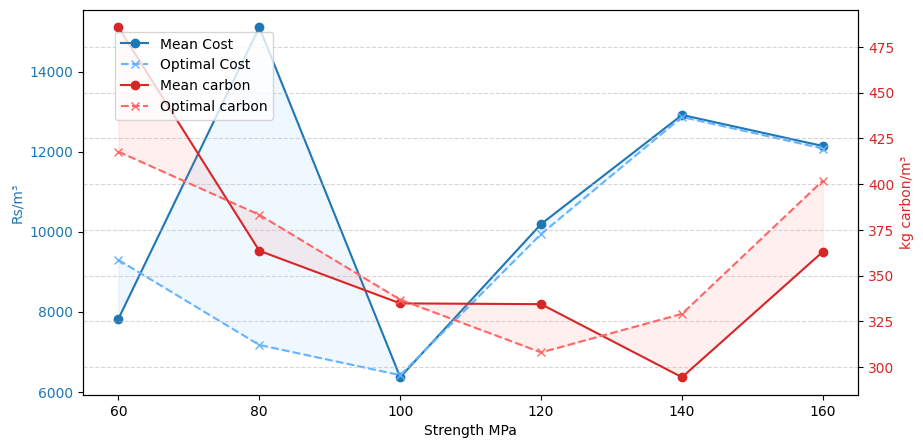

In [ ]:

epochs = 5000
for epoch in range(epochs):
    model.train()
    for x_batch, y_batch in train_loader:
        optimizer.zero_grad()
        
        # Forward pass
        recon_x, mu, logvar = model(x_batch, y_batch)
        
        # Calculate losses
        loss = loss_function(recon_x, x_batch, mu, logvar)

        total_loss = loss.requires_grad_()
        total_loss.backward(retain_graph=True)
        optimizer.step()

    # Evaluation on test set
    model.eval()
    with torch.no_grad():
        for x_batch, y_batch in test_loader:
            recon_x, mu, logvar = model(x_batch, y_batch)
            vae_loss, material_costs_loss, embedded_carbon_loss = loss_function(recon_x, x_batch, mu, logvar)

# Given compressive strengths and subplots
compressive_strengths = [60, 80, 100, 120, 140, 160]
fig, axes = plt.subplots(2, 3, figsize=(15, 10))

costs_data = {}

# Define the columns for the results
results_columns = [
    "Cement (kg/m³)", "SF (kg/m³)", "BFS (kg/m³)", "FA (kg/m³)", "QP (kg/m³)",
    "LSP (kg/m³)", "NS (kg/m³)", "Fiber (kg/m³)", "Sand (kg/m³)", "Gravel (kg/m³)",
    "Water (kg/m³)", "SP (kg/m³)", "T (°C)", "RH (%)", "Age (days)", "Strength (MPa)",
    "Material Cost (Rs.)", "Carbon (kg CO2/kg)"
]

# Iterate over compressive strengths
for idx, comp_strength in enumerate(compressive_strengths):
    row, col = divmod(idx, 3)  # Get subplot row and column indices
    ax = axes[row, col]  # Select the correct subplot

    # input_bounds = [
    #     (0, 1000), (0, 200), (0, 300), (0, 200), (0, 400), (0, 400), (0, 50),
    #     (0, 200), (0, 1500), (0, 1000), (0, 500), (0, 50), (0, 40), (30, 100), (1, 365)
    # ]

    input_bounds = [
        (0, 1000), (0, 1000), (0, 1000), (0, 1000), (0, 1000), (0, 1000), (0, 1000),
        (0, 1000), (0, 2000), (0, 1000), (0, 1000), (0, 1000), (0, 1000), (0, 1000), (0, 1000)
    ]
    graphs_points = []
    parameters = [
        material_costs,
        embedded_carbon,
        scaler_X,
        scaler_Y,
        comp_strength,
        model,
        catboost_model,
        graphs_points,
        input_bounds
    ]

    problem = CustomProblem(parameters)
    algorithm = NSGA2(pop_size=pop_size)

    res = minimize(
        problem,
        algorithm,
        ('n_gen', 50),
        seed=1,
        verbose=False,
    )

    feasible_mask = np.all(res.G <= 0, axis=1)
    feasible_solutions = res.X[feasible_mask]
    feasible_objectives = res.F[feasible_mask]

    # Prepare results for the best solution
    np_compressive_strength = np.full((len(feasible_solutions), 1), comp_strength)
    Y_normalized = scaler_Y.transform(np_compressive_strength)
    z_tensor = torch.tensor(feasible_solutions, dtype=torch.float32)
    y_tensor = torch.tensor(Y_normalized, dtype=torch.float32)
    decoded_output = model.decode(z_tensor, y_tensor)
    X_denormalized = scaler_X.inverse_transform(decoded_output.detach().numpy())
    compressive_strength_predictions = catboost_model.predict(X_denormalized)

    # Combine the decoded solutions and the compressive strength predictions
    solutions = np.column_stack((X_denormalized, compressive_strength_predictions))

    # Append the objective values (material_cost and embedded_carbon) to the solutions
    solutions = np.column_stack((solutions, feasible_objectives))
    pareto_solutions = pd.DataFrame(solutions)
    pareto_solutions.to_csv(f"output_vae_full_weight/solutions_c1={c1}, c2={c2}, CS={comp_strength}")


    # Prepare results for the best solution
    sorted_pareto_front, best_solution, best_cost, best_carbon = pareto_sorting(pareto_solutions,comp_strength)
    if sorted_pareto_front is None:
        continue  # Skip to the next iteration if no valid solutions were found
    best_solution_values = best_solution.iloc[:-3].values
    best_solution_values = np.append(best_solution_values, [best_solution.iloc[-3], best_cost, best_carbon])

    # Print the best solution in the required format
    print(f"\nBest Solution {comp_strength} MPa:")
    solution_df = pd.DataFrame([best_solution_values], columns=results_columns)
    print(solution_df.to_string(index=False))

    # Plotting data for the current compressive strength
    # Plotting data for the current compressive strength
    graph_points_array = np.array(graphs_points)
    vae_costs = graph_points_array[:, 0, :].flatten()
    vae_carbon = graph_points_array[:, 1, :].flatten()

    points = np.column_stack((vae_costs, vae_carbon))
    points = points[points[:, 0].argsort()]

    pareto_front = []
    current_min_carbon = np.inf
    for cost, carbon in points:
        if carbon < current_min_carbon:
            pareto_front.append([cost, carbon])
            current_min_carbon = carbon

    pareto_front = np.array(pareto_front)

    # # Append the best cost and best carbon to the results
    # costs_data[str(comp_strength)].append(vae_costs.mean())
    # costs_data[str(comp_strength)].append(vae_carbon.mean())
    # Store the results in the correct format for material cost and carbon
    costs_data[str(comp_strength)] = [pareto_solutions.iloc[:, -2].mean(), pareto_solutions.iloc[:, -1].mean()]
    costs_data[str(comp_strength)].append(best_cost)
    costs_data[str(comp_strength)].append(best_carbon)

    ax.scatter(vae_costs, vae_carbon, color="gray", alpha=0.5, s=5, label="Sampled Designs")
    ax.scatter(pareto_front[:, 0], pareto_front[:, 1], color="red", edgecolor="red", label="Pareto Frontier", s=5)
    ax.scatter(best_cost, best_carbon, color="blue", marker="x", s=100, label="Best Solution")

    ax.set_xlabel("Material Cost")
    ax.set_ylabel("Embodied Carbon")
    ax.set_title(f"Target Compressive Strength = {comp_strength} MPa")
    ax.legend()
    ax.grid(True)

# Extracting data
strength = list(costs_data.keys())  # Strength values
mean_cost = [v[0] for v in costs_data.values()]  # Mean cost
mean_co2 = [v[1] for v in costs_data.values()]  # Mean CO2
optimal_cost = [v[2] for v in costs_data.values()]  # Optimal cost
optimal_co2 = [v[3] for v in costs_data.values()]  # Optimal CO2

fig, ax1 = plt.subplots(figsize=(10, 5))

# First Y-axis (Cost)
ax1.set_xlabel("Strength MPa")
ax1.set_ylabel("Rs/m³", color="#1f77b4")  # Blue
ax1.plot(strength, mean_cost, 'o-', color="#1f77b4", label="Mean Cost")
ax1.plot(strength, optimal_cost, 'x--', color="#66b3ff", label="Optimal Cost")  # Light Blue
ax1.tick_params(axis='y', labelcolor="#1f77b4")

# Second Y-axis (CO2)
ax2 = ax1.twinx()
ax2.set_ylabel("kg carbon/m³", color="#d62728")  # Red
ax2.plot(strength, mean_co2, 'o-', color="#d62728", label="Mean carbon")
ax2.plot(strength, optimal_co2, 'x--', color="#ff6666", label="Optimal carbon")  # Light Red
ax2.tick_params(axis='y', labelcolor="#d62728")

# Fill between shaded regions
ax1.fill_between(strength, mean_cost, optimal_cost, color="#66b3ff", alpha=0.1)  # Light Blue
ax2.fill_between(strength, mean_co2, optimal_co2, color="#ff6666", alpha=0.1)  # Light Red

# Combined Legend
fig.legend(loc="upper left", bbox_to_anchor=(0.15, 0.85))

plt.grid(True, linestyle="--", alpha=0.5)
plt.show()



# comparison with a mixture present in the data

In [49]:

for cs in [60,80,100,120,140,160]:
    print(f"\ncs={cs}")
    temp = df[(df['fc (MPa)'] > (cs - 0.05 * cs)) & (df['fc (MPa)'] < (cs + 0.05 * cs))].copy()
    temp["material_costs"]=np.sum(material_costs*temp.iloc[:,:-1],axis=1)
    temp["embedded_carbon"]=np.sum(embedded_carbon*temp.iloc[:,:-2],axis=1)

    print(f"mean_cost={temp['material_costs'].mean()} --- mean_embedded_carbon={temp['embedded_carbon'].mean()}")



cs=60
mean_cost=13221.143157894738 --- mean_embedded_carbon=556.3276768421052

cs=80
mean_cost=24942.647333333338 --- mean_embedded_carbon=745.3763763333334

cs=100
mean_cost=25241.708000000002 --- mean_embedded_carbon=771.4930188

cs=120
mean_cost=28478.269833333332 --- mean_embedded_carbon=831.8897067500002

cs=140
mean_cost=32762.810161290327 --- mean_embedded_carbon=903.5208403225806

cs=160
mean_cost=35642.63223684211 --- mean_embedded_carbon=962.9866952105266
